# SNA Project Round 1

## Importing libraries
NumPy (np):
- Numerical computing library for Python.

NetworkX (nx):
- Graph analysis and visualization library.

Matplotlib.pyplot (plt):
- Plotting library for creating visualizations.

Seaborn (sns):
- Statistical data visualization library.

Pandas (pd):
- Data manipulation and analysis library.







In [1]:
import numpy as np
import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt
import os
import seaborn as sns
import pandas as pd
%matplotlib inline

The following code is specific to google colab. The datasets can be found on [Wiki Dataset](https://snap.stanford.edu/data/wiki-Vote.html) and [Facebook Dataset](https://snap.stanford.edu/data/ego-Facebook.html)

In [ ]:

from google.colab import drive

In [3]:
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
facebook_path = './facebook_combined'
email_path = './wiki_Vote'

In [3]:
if os.path.exists(facebook_path):
    print("Folder exists. Loading...")
    files = os.listdir(facebook_path)
    for file in files:
      print(file)
else:
    print("Folder not found.")

Folder exists. Loading...
facebook_combined.txt


In [4]:
wiki = nx.read_edgelist('./wiki-Vote/Wiki-Vote.txt', create_using = nx.DiGraph(), nodetype = int)
wiki

In [5]:
g = nx.read_edgelist('./facebook_combined/facebook_combined.txt', create_using = nx.Graph(), nodetype = int)
g

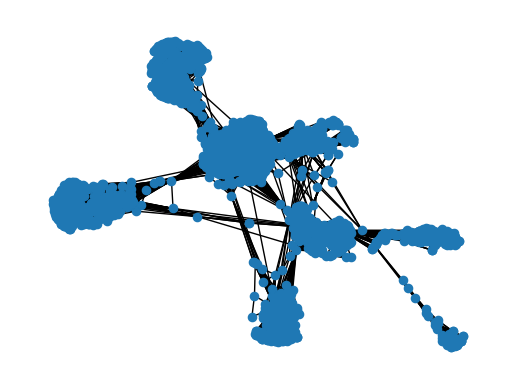

In [79]:
sp = nx.spring_layout(g)
plt.axis('off')
nx.draw_networkx(g, pos = sp, with_labels = False, node_size = 35)
plt.show()

In [80]:
num_components = nx.number_connected_components(g)

print("Number of connected components:", num_components)


Number of connected components: 1


SCC and WCC is not defined for an undirected graph

In [81]:
print(f"The diameter of the Facebook network is {nx.diameter(g)}")

The diameter of the Facebook network is 8


In [82]:
facebook_data_summary = {
    "nodes": len(nx.nodes(g)),
    "edges": len(nx.edges(g)),
    'diameter': nx.diameter(g),
    "average_clustering_coefficient": nx.average_clustering(g),
    'nodes in largest SCC': len(nx.nodes(g)),
    'edges in largest SCC': len(nx.edges(g)),
    'nodes in largest WCC': len(nx.nodes(g)),
    'edges in largest WCC': len(nx.edges(g))
}


In [83]:
# Create DataFrame from dictionary
facebook_df = pd.Series(facebook_data_summary)

# Display DataFrame
facebook_df

nodes                              4039.000000
edges                             88234.000000
diameter                              8.000000
average_clustering_coefficient        0.605547
nodes in largest SCC               4039.000000
edges in largest SCC              88234.000000
nodes in largest WCC               4039.000000
edges in largest WCC              88234.000000
dtype: float64

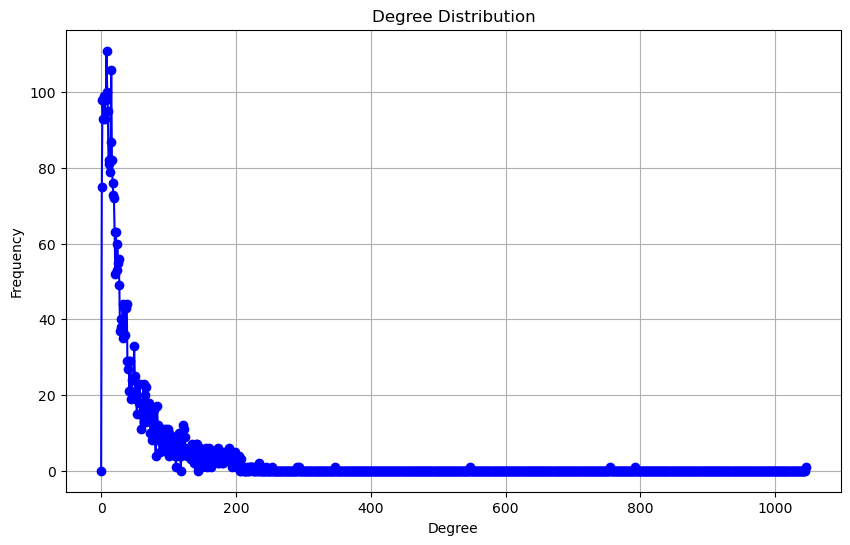

In [84]:
degrees = [degree for (node, degree) in g.degree()]
degree_hist = nx.degree_histogram(g)

plt.figure(figsize=(10, 6))
plt.plot(degree_hist, 'b-', marker='o')
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

C:\Users\hp\AppData\Local\Temp\ipykernel_21088\2300356068.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(degrees_array, shade=True)


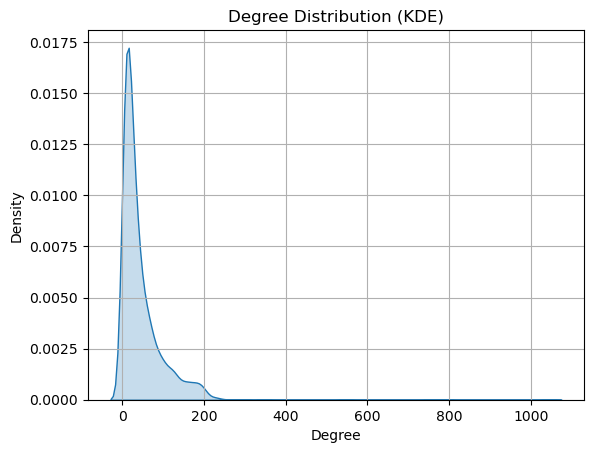

In [85]:
degrees = [degree for (node, degree) in g.degree()]

degrees_array = np.array(degrees)

sns.kdeplot(degrees_array, shade=True)
plt.title("Degree Distribution (KDE)")
plt.xlabel("Degree")
plt.ylabel("Density")
plt.grid(True)
plt.show()

The kernel density estimation (KDE) plot generated by seaborn is an estimation of the probability density function of the data. While it's not possible to have negative degrees in a network, the KDE plot might still show some density on the left side of zero due to the nature of the KDE estimation.

The KDE plot works by placing a kernel (typically a Gaussian) at each data point and summing them up to create a smooth estimate of the probability density function. This estimation can sometimes result in density being spread out to regions where there are no data points, including negative values when the data itself is non-negative.

In [86]:
max_degree = max(degrees)
min_degree = min(degrees)

print("Maximum Degree:", max_degree)
print("Minimum Degree:", min_degree)

Maximum Degree: 1045
Minimum Degree: 1


In [87]:
avg_degree = np.mean(degrees)
print("Average Degree:", avg_degree)

Average Degree: 43.69101262688784


In [88]:
std_dev = np.std(degrees)
print("Standard Deviation of Degree Distribution:", std_dev)

Standard Deviation of Degree Distribution: 52.41411556737521


In [89]:
nx.has_bridges(g)

True

In [90]:
def draw_subgraph_with_bridges(g, bridges):

    bridge_graph = nx.Graph()
    bridge_graph.add_edges_from(bridges)

    pos = nx.spring_layout(g)
    nx.draw(g, pos, with_labels=False, node_color='skyblue', node_size=0.5, edge_color='black', width=0)

    nx.draw(bridge_graph, pos, with_labels=False, node_color='skyblue', node_size=0.5, edge_color='red', width=10)

    plt.title("Subgraph Highlighting Bridge Edges")
    plt.show()


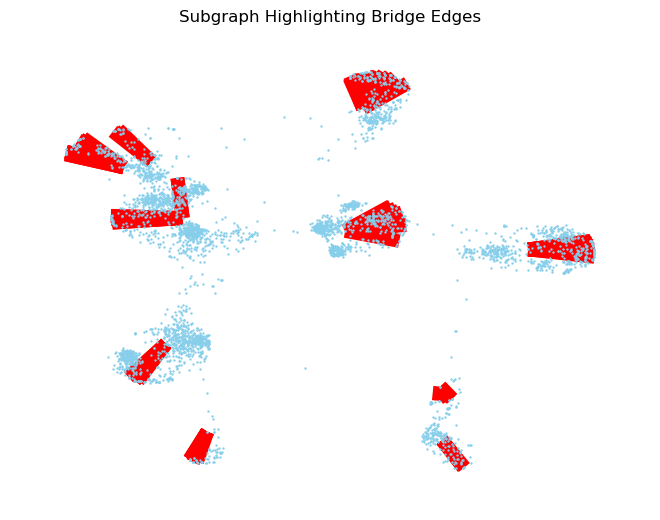

In [91]:

bridges = list(nx.bridges(g))

draw_subgraph_with_bridges(g, bridges)

It can be observed that all the bridges are among clusters. There is no Bridge between to differenet clusters. So we can say that the network does not have a choke link.

In [92]:
def plot_centrality(centrality, g, sp):
    # Calculate number of nodes to consider (top 10%)
    num_nodes = int(0.1 * len(g.nodes()))

    all_nodes = [(node, centrality[node]) for node in centrality]
    sorted_nodes = sorted(all_nodes, key=lambda x: x[1])
    top_nodes = [n for (n, c) in sorted_nodes[-num_nodes:]]
    node_colors = ['red' if node in top_nodes else 'yellow' for node in g.nodes()]
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    nx.draw(g, pos=sp, node_color=node_colors, with_labels=False, alpha=0.2)
    plt.title("Centrality measure for top nodes as red")

    top_10 = sorted_nodes[-10:]
    df = pd.DataFrame(top_10, columns=['Node', 'Centrality'])

    plt.subplot(1, 2, 2)
    plt.table(cellText=df.values, colLabels=df.columns, cellLoc='center', loc='center')
    plt.axis('off')
    plt.title("Top 10 Nodes of Top Ranked")

    plt.tight_layout()
    plt.show()


The above function

In [93]:
def centrality(g, centrality, sp):
  match centrality:
    case "degree":
      degree_centrality = nx.degree_centrality(g)
      plot_centrality(degree_centrality, g, sp)
      return degree_centrality
    case 'eigenvector':
      eigenvector_centrality = nx.eigenvector_centrality(g)
      plot_centrality(eigenvector_centrality, g, sp)
      return eigenvector_centrality
    case 'pagerank':
      pagerank_centrality = nx.pagerank(g)
      plot_centrality(pagerank_centrality, g, sp)
      return pagerank_centrality
    case 'closeness':
      closeness_centrality = nx.closeness_centrality(g)
      plot_centrality(closeness_centrality, g, sp)
      return closeness_centrality
    case 'betweenness':
      betweenness_centrality = nx.betweenness_centrality(g)
      plot_centrality(betweenness_centrality, g, sp)
      return betweenness_centrality
    case 'katz':
      katz_centrality = nx.katz_centrality(g, alpha = 0.1, beta = 1, max_iter=2000, tol = 1e-6)
      plot_centrality(katz_centrality, g, sp)
      return katz_centrality
    case _:
      print("Not a valid centrality")

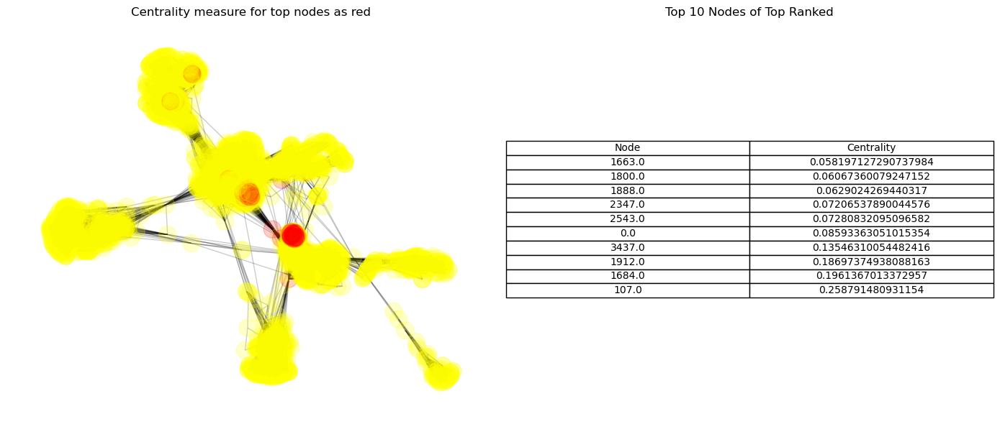

In [94]:
degree = centrality(g, 'degree', sp)

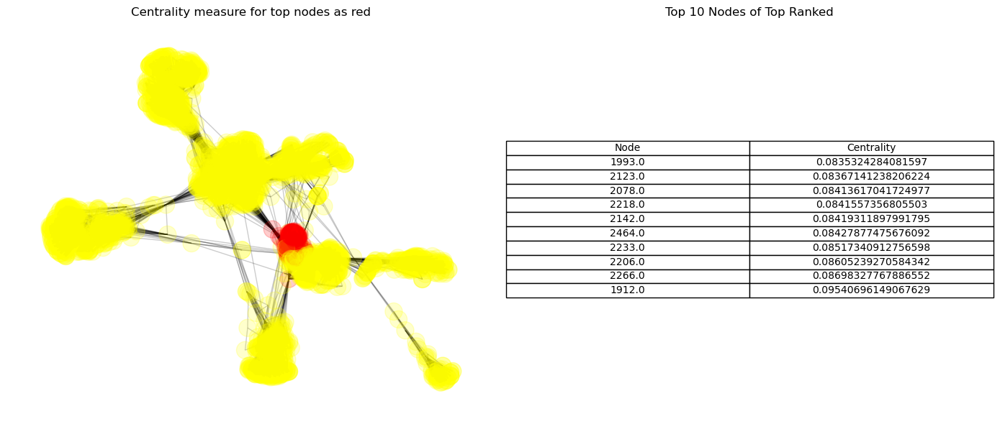

In [95]:
eigen = centrality(g,'eigenvector', sp)

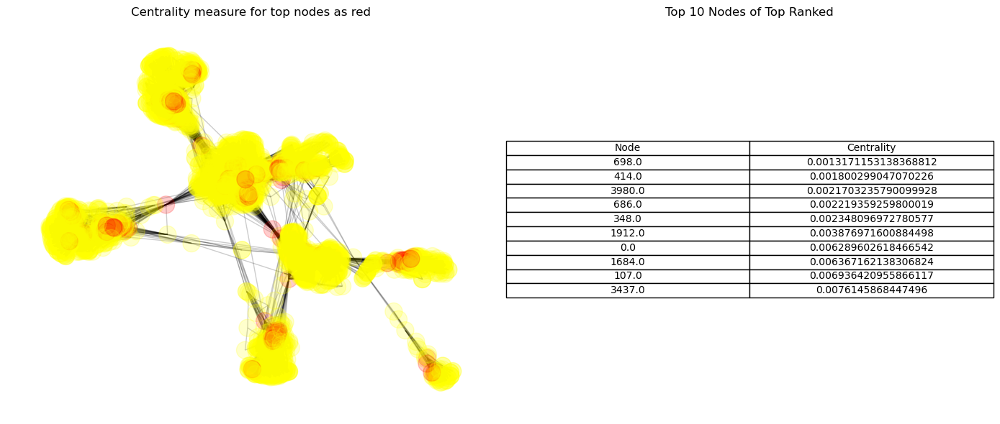

In [96]:
pagerank = centrality(g,'pagerank', sp)

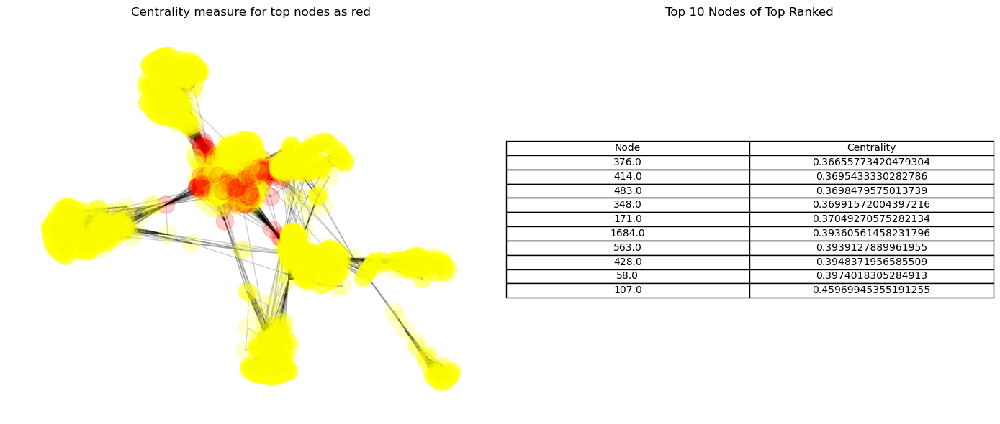

In [97]:
closeness = centrality(g, 'closeness', sp)

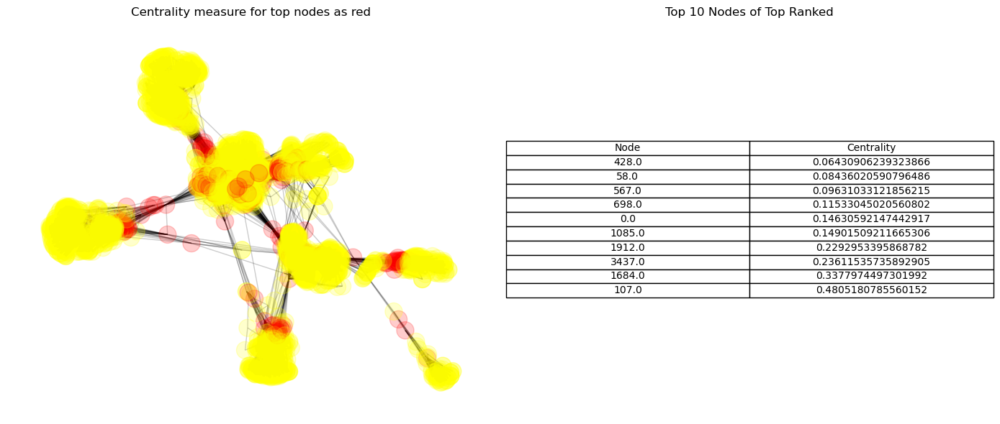

In [98]:
betweenness = centrality(g, 'betweenness', sp)

In [99]:
def clustering(g, type):
  match type:
    case "local":
      local_clustering_coefficient = nx.clustering(g)

      c_values = local_clustering_coefficient.values()
      sns.kdeplot(c_values, shade=True)
      plt.title('Density Estimation Plot')
      plt.xlabel('Values')
      plt.ylabel('Density')
      plt.show()

      return local_clustering_coefficient
    case "global":
      global_clustering_coefficient = nx.transitivity(g)
      return global_clustering_coefficient
    case 'average':
      avg_local_clustering_coefficient = nx.average_clustering(g)
      return avg_local_clustering_coefficient
    case _:
      print('Not a valid type of clustering')

C:\Users\hp\AppData\Local\Temp\ipykernel_21088\2584069776.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(c_values, shade=True)


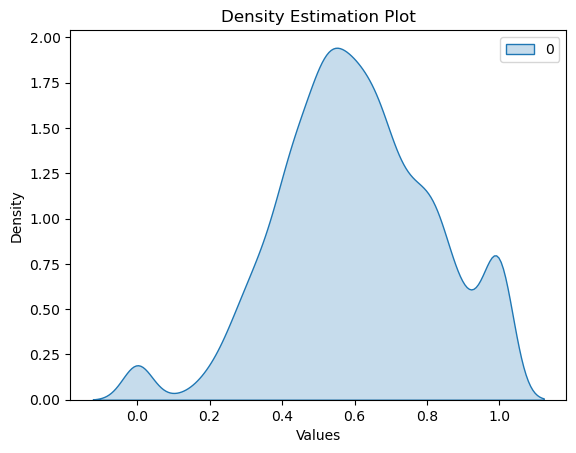

In [100]:
local = clustering(g, 'local')

In [101]:
globalC = clustering(g, 'global')
globalC

0.5191742775433075

In [102]:
AverageC = clustering(g, 'average')
AverageC

0.6055467186200876

# Dataset2

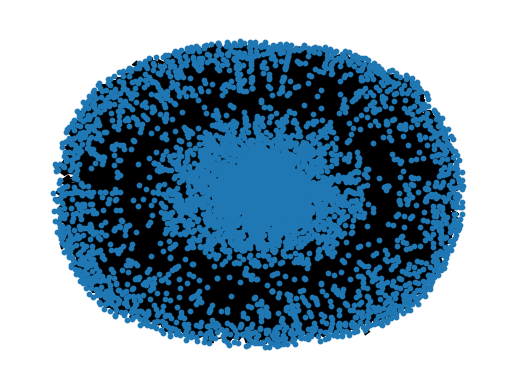

In [6]:
spe = nx.spring_layout(wiki)
plt.axis('off')
nx.draw_networkx(wiki, pos = spe, with_labels = False, node_size = 10)
plt.show()

In [104]:
print(bipartite.is_bipartite(wiki))

False


Found infinite path length because the digraph is not strongly connected. So we can't find the diameter of the graph as it's not a connected graph.

In [105]:
scc = nx.number_strongly_connected_components(wiki)
print("Number of strongly connected components:", scc)

wcc = nx.number_weakly_connected_components(wiki)
print("Number of weakly connected components:", wcc)


Number of strongly connected components: 5816
Number of weakly connected components: 24


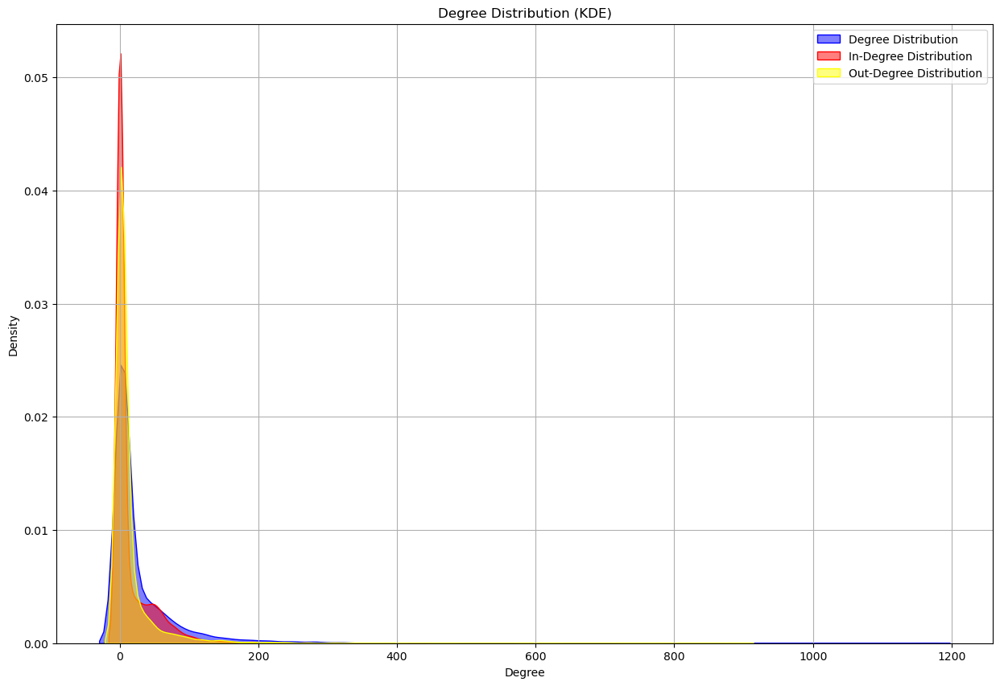

In [106]:
import matplotlib.pyplot as plt
import seaborn as sns

degrees = [degree for (node, degree) in list(wiki.degree())]
in_degrees = [degree for (node, degree) in list(wiki.in_degree)]
out_degrees = [degree for (node, degree) in list(wiki.out_degree)]

plt.figure(figsize=(15, 10))

sns.kdeplot(degrees, fill=True, color='Blue', alpha=0.5, label='Degree Distribution')
sns.kdeplot(in_degrees, fill=True, color='Red', alpha=0.5, label='In-Degree Distribution')
sns.kdeplot(out_degrees, fill=True, color='yellow', alpha=0.5, label='Out-Degree Distribution')

plt.legend()

plt.title("Degree Distribution (KDE)")
plt.xlabel("Degree")
plt.ylabel("Density")
plt.grid(True)
plt.show()


In [107]:
max_degree = max(degrees)
min_degree = min(degrees)

print("Maximum Degree:", max_degree)
print("Minimum Degree:", min_degree)

Maximum Degree: 1167
Minimum Degree: 1


In [108]:
avg_degree = np.mean(degrees)
print("Average Degree:", avg_degree)

Average Degree: 29.146591707659873


In [109]:
std_dev = np.std(degrees)
print("Standard Deviation of Degree Distribution:", std_dev)

Standard Deviation of Degree Distribution: 60.38575467951764


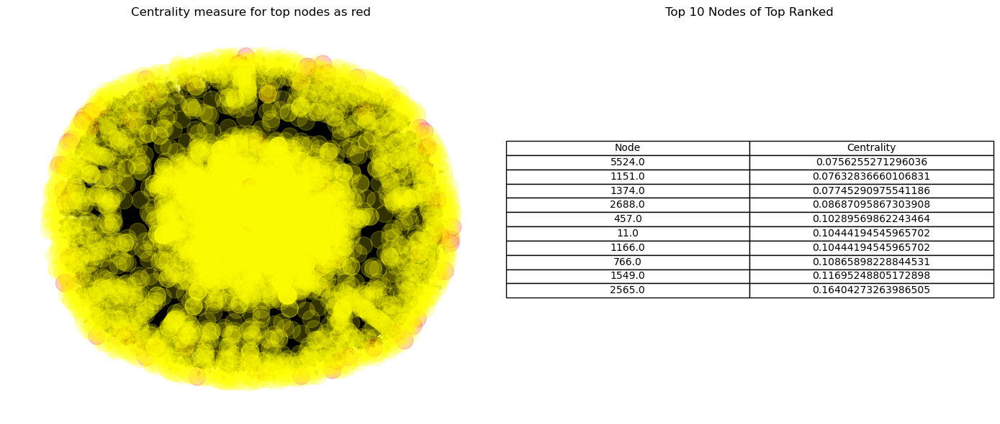

In [110]:
degree = centrality(wiki, 'degree', spe)

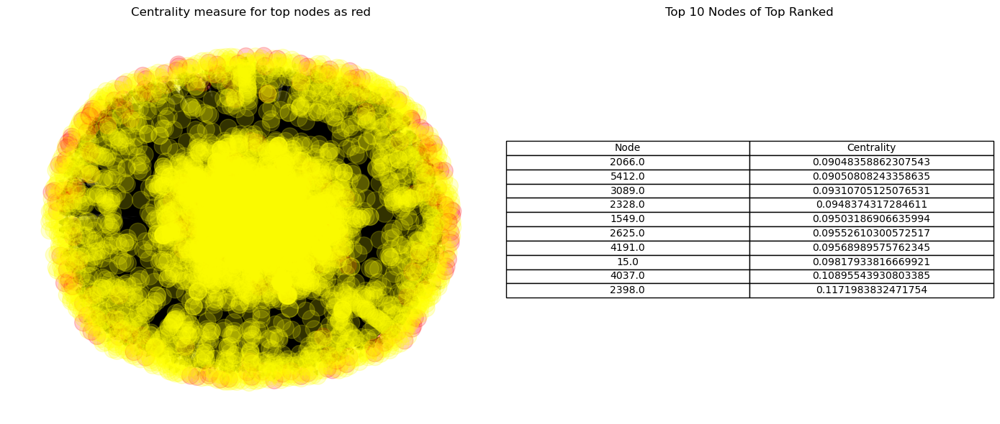

In [111]:
eigen = centrality(wiki, 'eigenvector', spe)

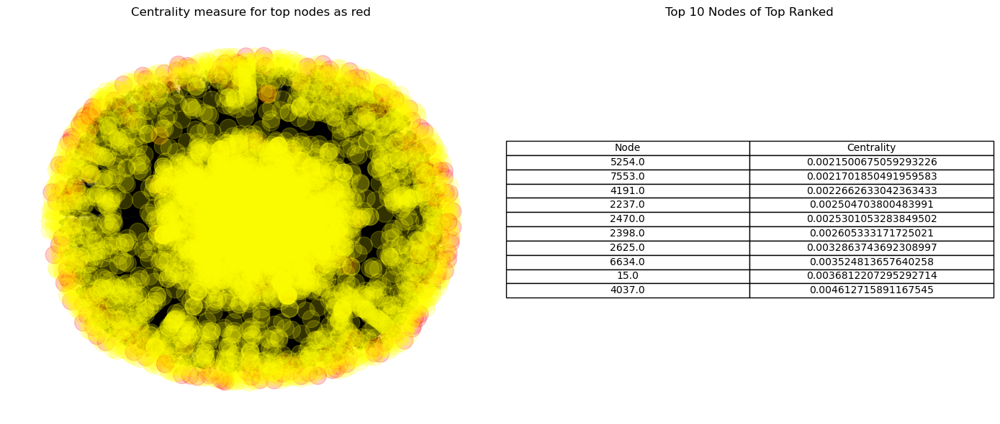

In [112]:
page = centrality(wiki, 'pagerank', spe)


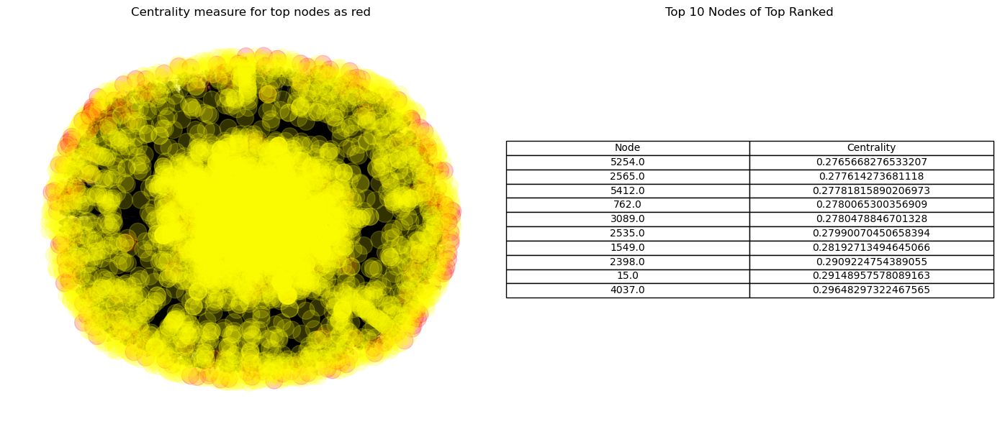

In [113]:
closeness = centrality(wiki, 'closeness', spe)


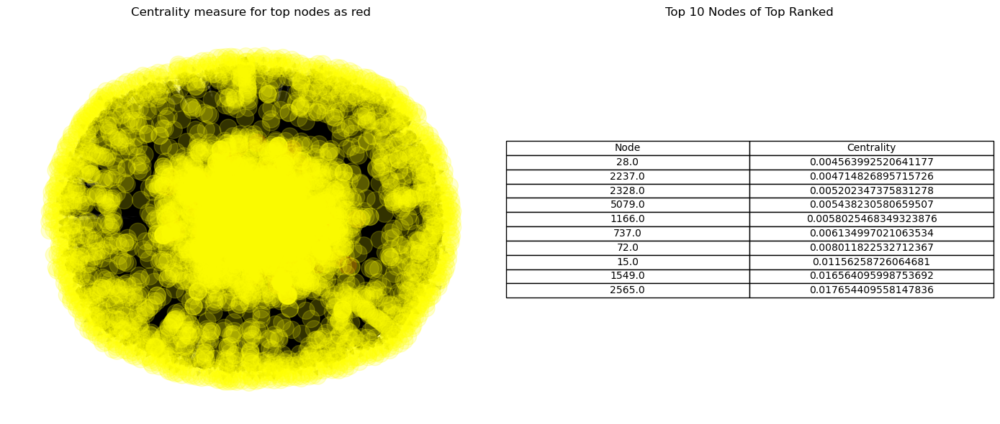

In [114]:
betweenness = centrality(wiki, 'betweenness', spe)

C:\Users\hp\AppData\Local\Temp\ipykernel_21088\2584069776.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(c_values, shade=True)


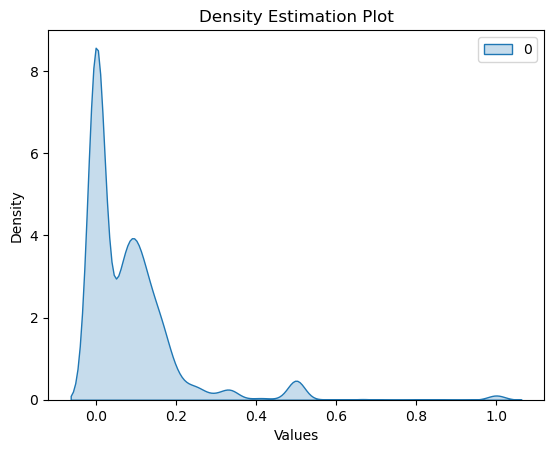

In [115]:
local = clustering(wiki, 'local')

In [116]:
globalC = clustering(wiki, 'global')
globalC

0.05285122817867548

In [117]:
AverageC = clustering(wiki, 'average')
AverageC

0.08156344522820935

In [118]:
reciprocity = nx.reciprocity(wiki)
reciprocity

0.0564572905515532

In [119]:
no_of_strongly_connected_components = nx.number_strongly_connected_components(wiki)
no_of_strongly_connected_components

5816

In [120]:
scc = nx.strongly_connected_components(wiki)
largest_scc = max(scc, key=len)
num_nodes_largest_scc = len(largest_scc)
num_nodes_largest_scc

1300

In [121]:
weakly_connected_components = nx.weakly_connected_components(wiki)
largest_wcc = max(weakly_connected_components, key=len)
num_nodes_largest_wcc = len(largest_wcc)
print("Number of nodes in the largest weakly connected component:", num_nodes_largest_wcc)

Number of nodes in the largest weakly connected component: 7066


# Round 2

In [8]:
import random
import networkx as nx
import matplotlib.pyplot as plt

def barabasi_albert_model(num_nodes, num_edges_to_attach):
    # Initialize a complete graph with num_edges_to_attach nodes
    G = nx.complete_graph(num_edges_to_attach)

    # List to track the degree of each node (nodes appear multiple times based on their degree)
    degree_tracker = list(G.nodes)

    # Add new nodes one at a time
    for new_node in range(num_edges_to_attach, num_nodes):
        # Randomly select existing nodes based on their degree
        selected_nodes = random.choices(degree_tracker, k=num_edges_to_attach)

        # Add edges from the new node to the selected nodes
        for selected_node in selected_nodes:
            G.add_edge(new_node, selected_node)

        # Update the degree tracker
        degree_tracker.append(new_node)
        degree_tracker.extend(selected_nodes)

    return G

# Specify the number of nodes and the number of edges to attach from a new node
num_nodes = 15000  # Number of nodes you want in the graph
num_edges_to_attach = 5  # Number of edges to attach from a new node to existing nodes

# Create the Barabasi-Albert model
G = barabasi_albert_model(num_nodes, num_edges_to_attach)

# Examine properties of the graph (optional)
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")


Number of nodes: 15000
Number of edges: 72130


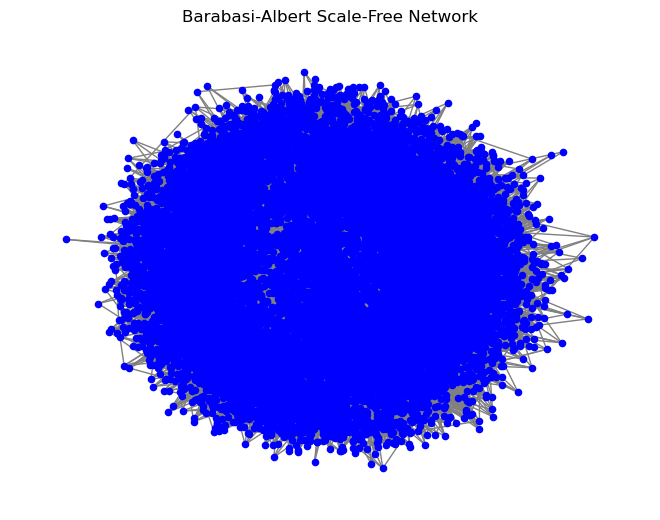

In [9]:
pos = nx.spring_layout(G)
nx.draw(G, pos, node_size=20, node_color='blue', edge_color='gray', with_labels=False)
plt.title('Barabasi-Albert Scale-Free Network')
plt.show()

In [4]:
BA_summary = {
    "nodes": len(nx.nodes(G)),
    "edges": len(nx.edges(G)),
    'diameter': nx.diameter(G),
    "average_clustering_coefficient": nx.average_clustering(G),
    'nodes in largest SCC': len(nx.nodes(G)),
    'edges in largest SCC': len(nx.edges(G)),
    'nodes in largest WCC': len(nx.nodes(G)),
    'edges in largest WCC': len(nx.edges(G))
}


In [5]:
BA_df = pd.Series(BA_summary)
BA_df

nodes                             15000.000000
edges                             72327.000000
diameter                              5.000000
average_clustering_coefficient        0.178137
nodes in largest SCC              15000.000000
edges in largest SCC              72327.000000
nodes in largest WCC              15000.000000
edges in largest WCC              72327.000000
dtype: float64

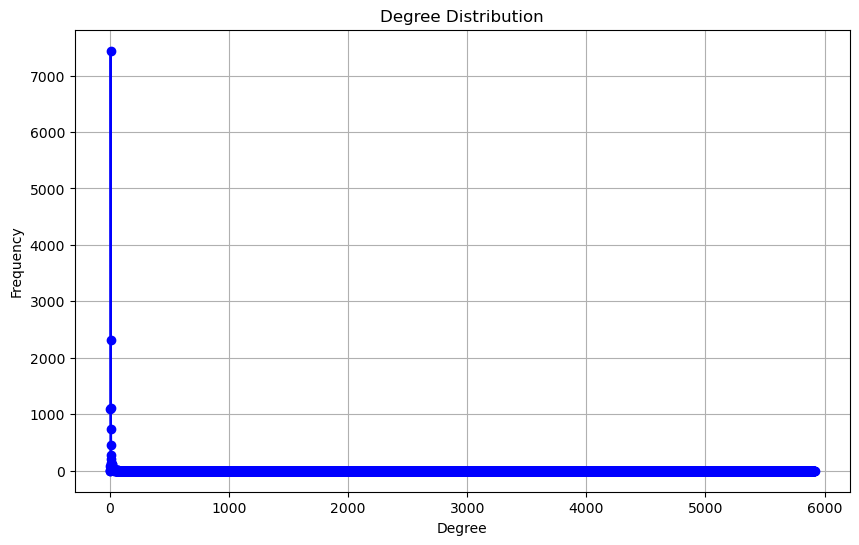

In [31]:
degrees = [degree for (node, degree) in G.degree()]
degree_hist = nx.degree_histogram(G)

plt.figure(figsize=(10, 6))
plt.plot(degree_hist, 'b-', marker='o')
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

In [32]:
max_degree = max(degrees)
min_degree = min(degrees)

print("Maximum Degree:", max_degree)
print("Minimum Degree:", min_degree)

Maximum Degree: 5916
Minimum Degree: 2


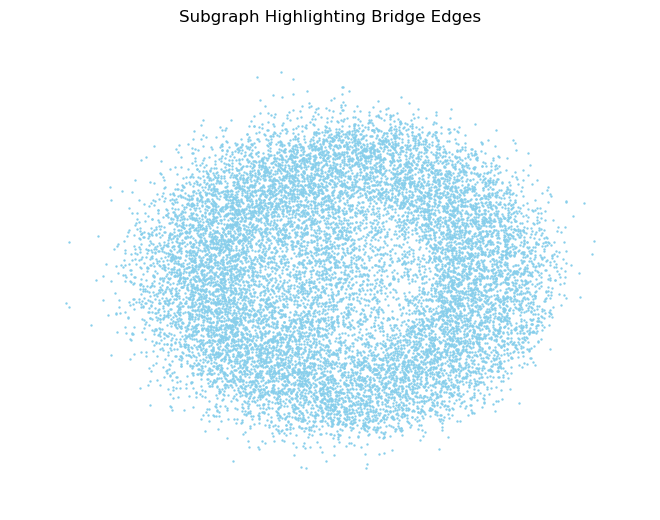

In [10]:
bridges = list(nx.bridges(G))
draw_subgraph_with_bridges(G, bridges)

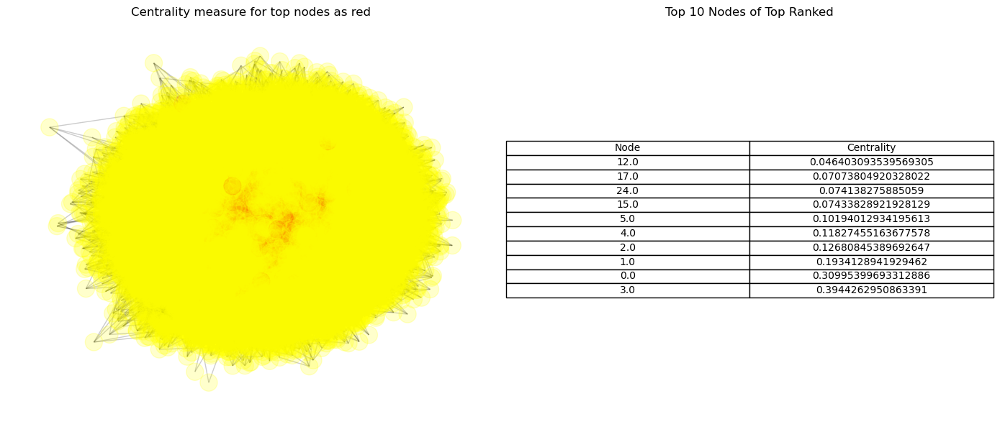

In [11]:
degree = centrality(G, 'degree', pos)

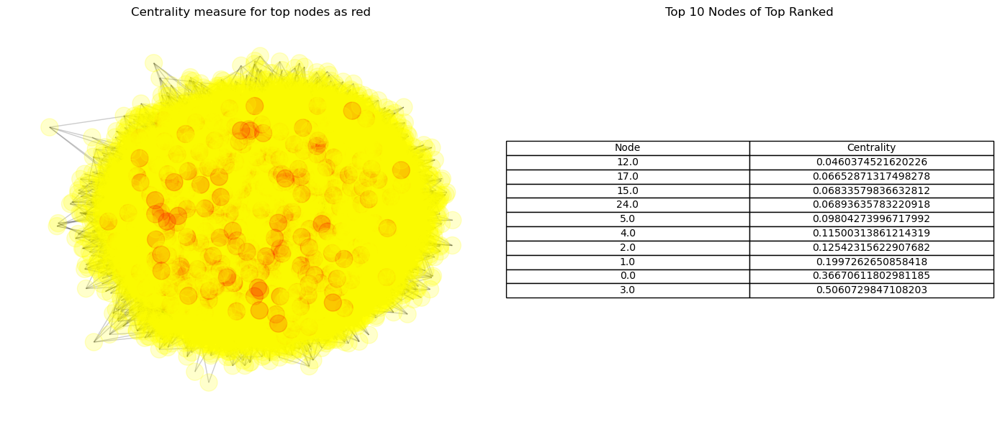

In [12]:
eigen = centrality(G,'eigenvector', pos)

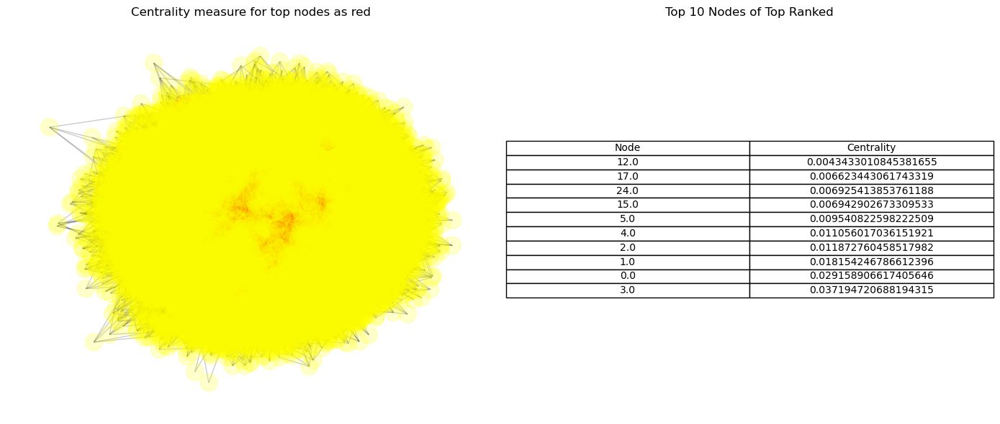

In [13]:
pagerank = centrality(G,'pagerank', pos)

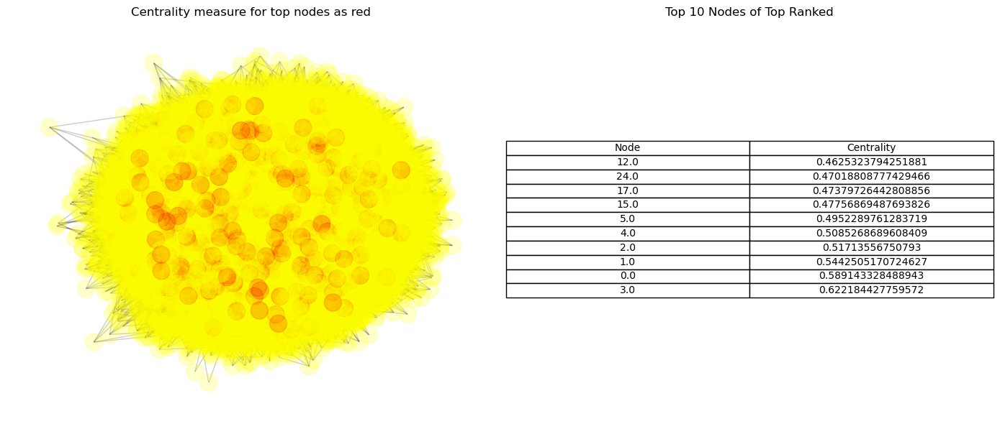

In [14]:
closeness = centrality(G, 'closeness', pos)

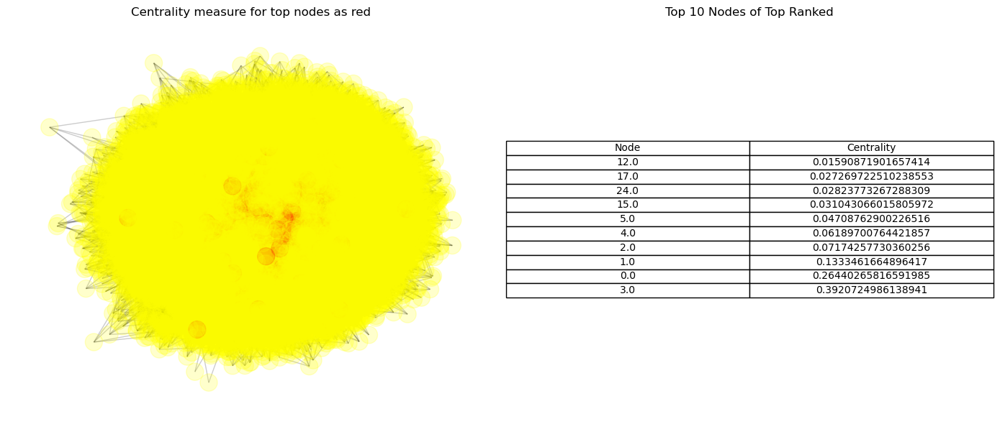

In [15]:
betweenness = centrality(G, 'betweenness', pos)

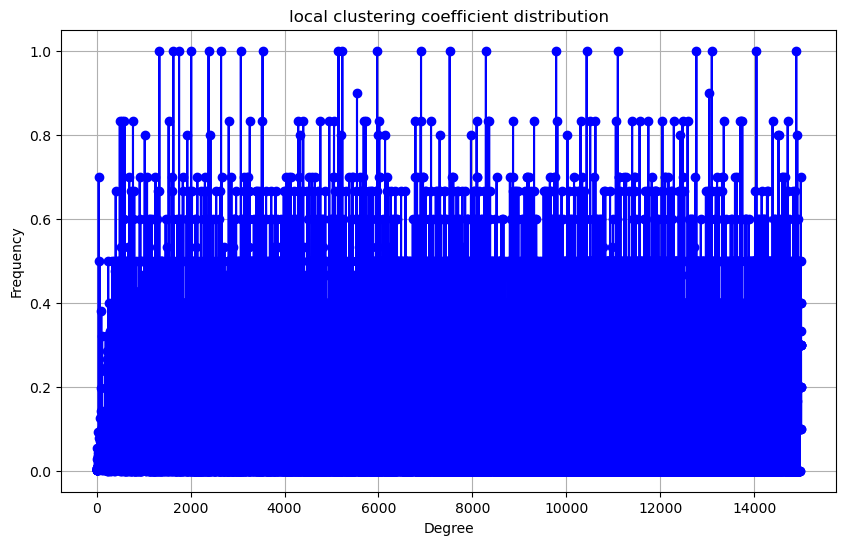

In [29]:
local_clustering_coefficient = nx.clustering(G)

degree_hist = local_clustering_coefficient.values()
plt.figure(figsize=(10, 6))
plt.plot(degree_hist, 'b-', marker='o')
plt.title("local clustering coefficient distribution")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

In [20]:
globalC = clustering(G, 'global')
globalC

0.00234170196653571

In [22]:
reciprocity = nx.reciprocity(G)
reciprocity

0.0

In [30]:
num_components = nx.number_connected_components(G)

print("Number of connected components:", num_components)

Number of connected components: 1


Since there is only a single connected component then there are 15000 nodes and 72327 edges in the largest connected component

In [33]:
avg_degree = np.mean(degrees)
print("Average Degree:", avg_degree)

Average Degree: 9.6436


In [34]:
std_dev = np.std(degrees)
print("Standard Deviation of Degree Distribution:", std_dev)

Standard Deviation of Degree Distribution: 74.08203411786153


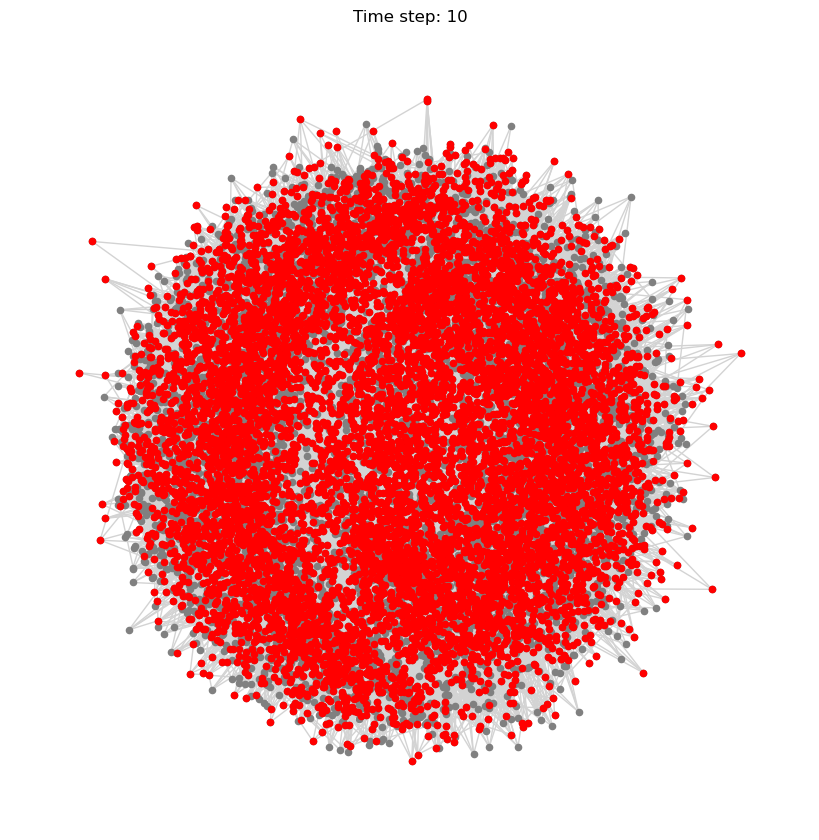

The time step required to reach the maximum number of active nodes: 10


In [10]:
import networkx as nx
import matplotlib.pyplot as plt
import random

def assign_activation_probabilities(G):
    """
    Assign random activation probabilities to each edge such that the sum of probabilities from a node to its neighbors is 1.
    """
    for node in G.nodes:
        neighbors = list(G.neighbors(node))
        if neighbors:
            # Assign random probabilities to neighbors such that the sum is 1
            probabilities = [random.random() for _ in range(len(neighbors))]
            total_prob = sum(probabilities)
            normalized_probabilities = [p / total_prob for p in probabilities]
            
            # Assign the normalized probabilities as edge attributes
            for neighbor, prob in zip(neighbors, normalized_probabilities):
                G[node][neighbor]['probability'] = prob

def independent_cascade(G, initial_active_nodes, activation_probability, images_dir='images'):
    """
    Simulates the Independent Cascade model on a NetworkX graph, visualizes the process, and finds the time step
    required to get to the maximum number of active nodes on the network.

    Args:
        G (networkx.Graph): The graph on which to apply the model.
        initial_active_nodes (set): A set of initial active nodes.
        activation_probability (float): Probability of activation.
        images_dir (str): The directory where images will be saved.

    Returns:
        int: The time step required to reach the maximum number of active nodes.
    """
    # Create images directory if it doesn't exist
    import os
    os.makedirs(images_dir, exist_ok=True)

    # Create a set to track the active nodes
    active_nodes = initial_active_nodes.copy()
    newly_active_nodes = initial_active_nodes.copy()

    # Initialize variables to track the maximum number of active nodes and the corresponding time step
    max_active_nodes = len(active_nodes)
    max_time_step = 0

    # Visualization setup
    plt.figure(figsize=(8, 8))
    pos = nx.spring_layout(G)

    # Iterate while there are newly active nodes
    time_step = 0
    while newly_active_nodes:
        current_new_nodes = newly_active_nodes.copy()
        newly_active_nodes.clear()

        # Calculate the number of active nodes and update the maximum and time step if necessary
        num_active_nodes = len(active_nodes)
        if num_active_nodes > max_active_nodes:
            max_active_nodes = num_active_nodes
            max_time_step = time_step

        # Visualize the current state of active nodes
        plt.clf()  # Clear the current plot
        nx.draw(G, pos, node_size=20, node_color='gray', edge_color='lightgray', with_labels=False)
        nx.draw_networkx_nodes(G, pos, nodelist=active_nodes, node_color='red', node_size=20)
        plt.title(f'Time step: {time_step}')
        plt.savefig(f'{images_dir}/{time_step}.jpeg')

        # Increment the time step
        time_step += 1

        # Attempt to activate neighbors of each newly active node
        for node in current_new_nodes:
            for neighbor in G.neighbors(node):
                if neighbor not in active_nodes:
                    # Activate the neighbor with the given probability
                    edge_prob = G[node][neighbor].get('probability', activation_probability)
                    if random.random() < edge_prob:
                        active_nodes.add(neighbor)
                        newly_active_nodes.add(neighbor)

    # Show the final plot (optional)
    plt.show()

    return max_time_step


assign_activation_probabilities(G)

# Define the initial active nodes (you can customize this set)
initial_active_nodes = {0, 1, 2}

# Apply the Independent Cascade model and visualize the process
max_time_step = independent_cascade(G, initial_active_nodes, 0.05)

print(f"The time step required to reach the maximum number of active nodes: {max_time_step}")


node is {14972}


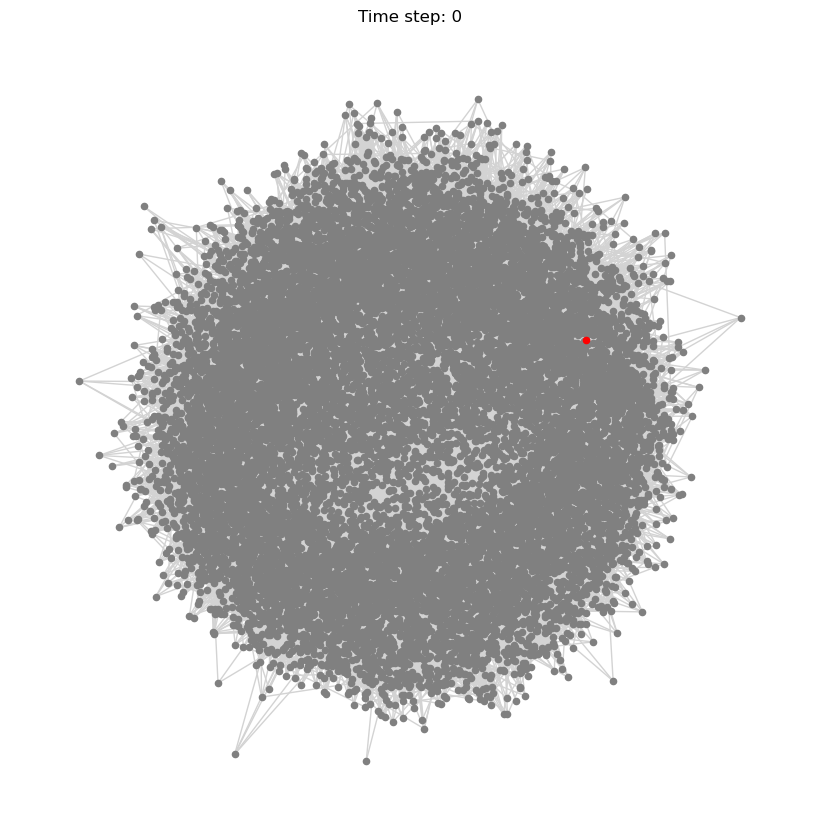

The time step required to reach the maximum number of active nodes: 0
node is {8662}


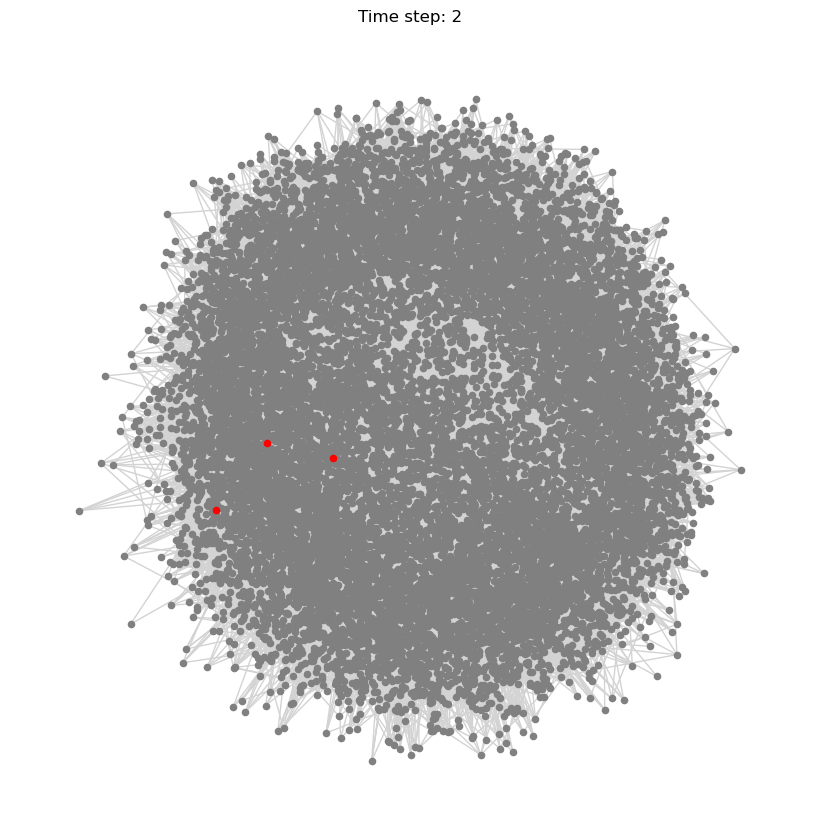

The time step required to reach the maximum number of active nodes: 2
node is {5534}


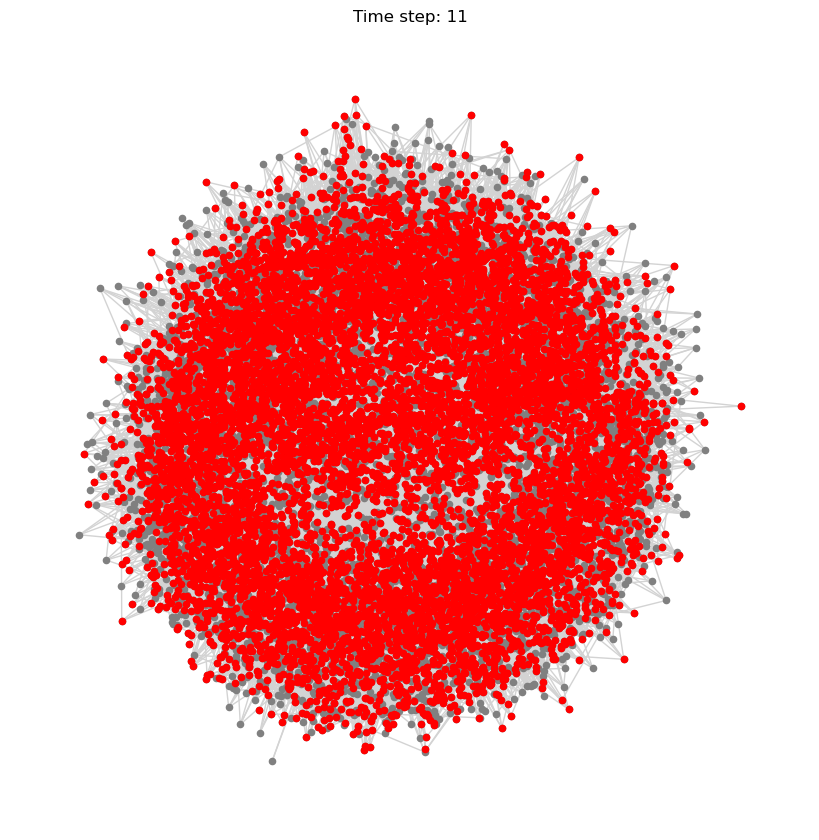

The time step required to reach the maximum number of active nodes: 11
node is {2759}


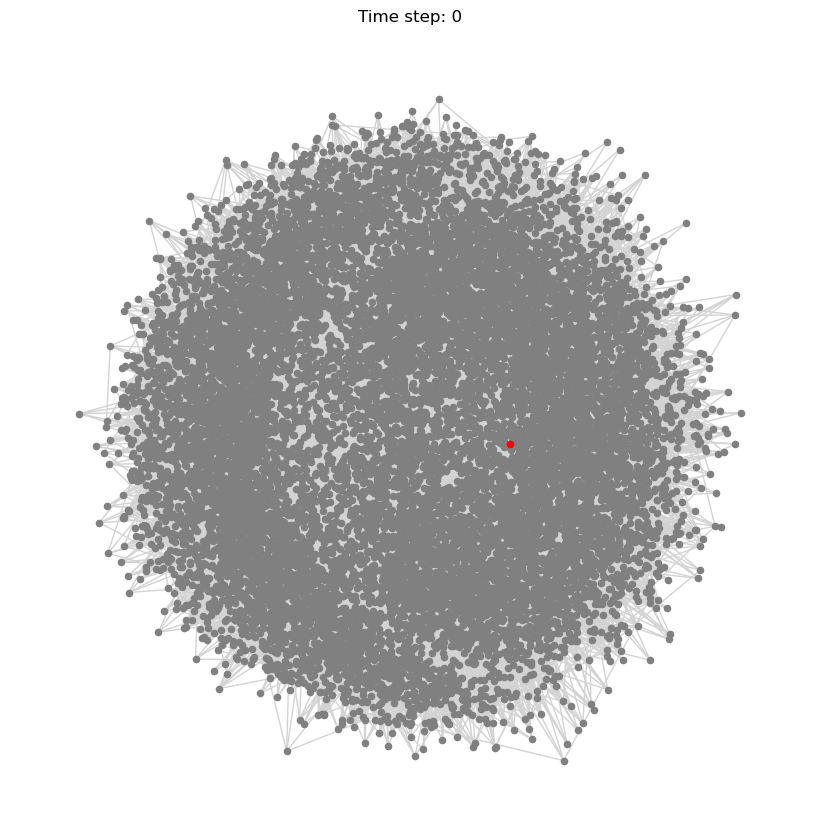

The time step required to reach the maximum number of active nodes: 0
node is {10005}


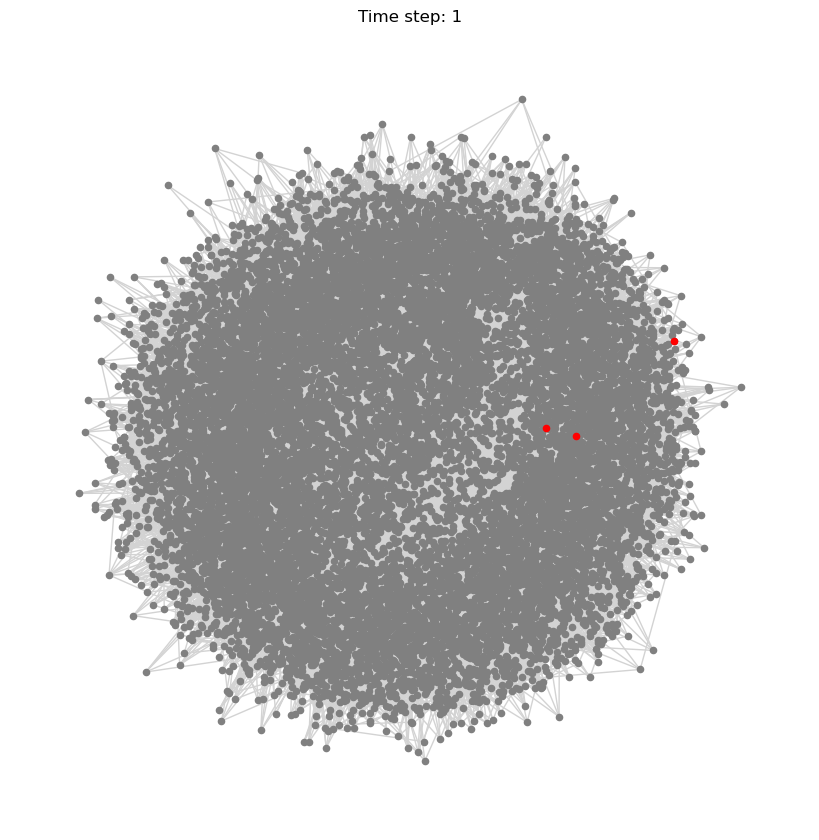

The time step required to reach the maximum number of active nodes: 1
node is {9494}


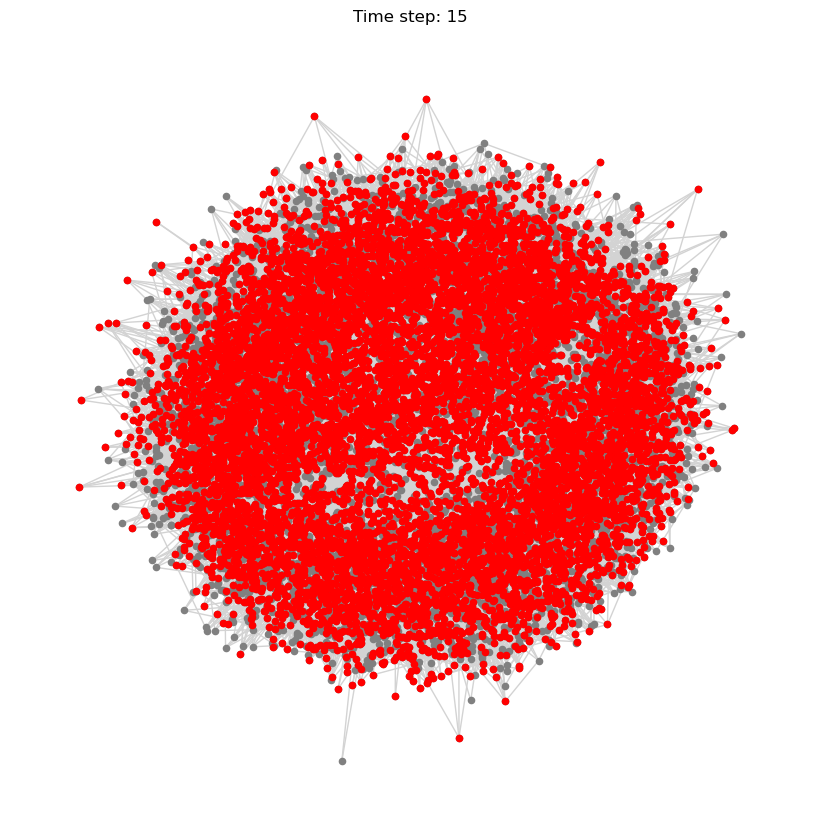

The time step required to reach the maximum number of active nodes: 15
node is {7134}


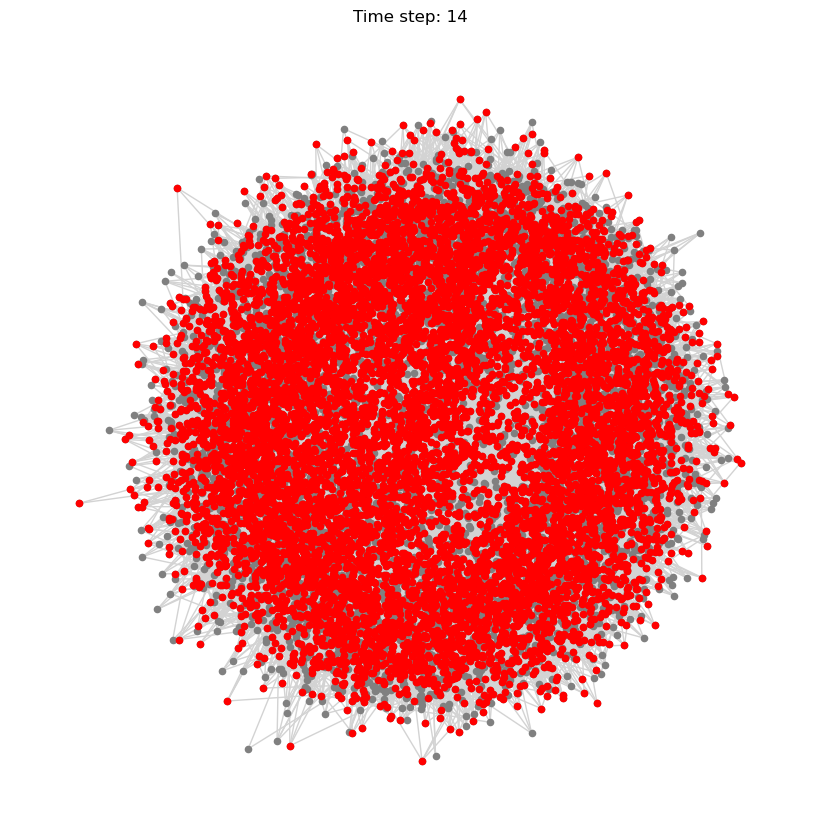

The time step required to reach the maximum number of active nodes: 14
node is {6846}


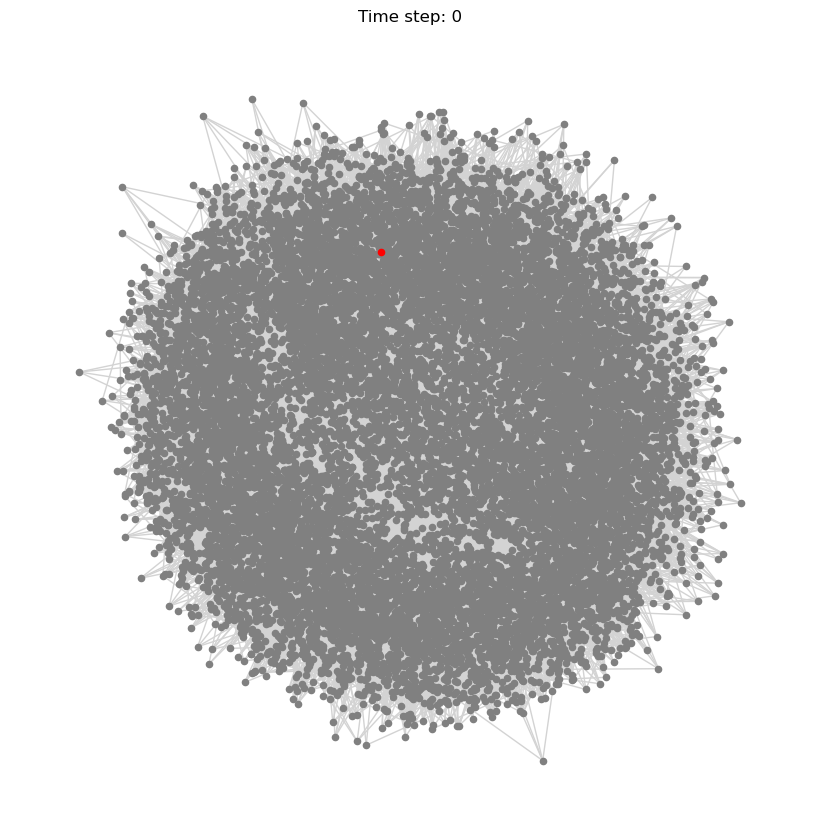

The time step required to reach the maximum number of active nodes: 0
node is {1613}


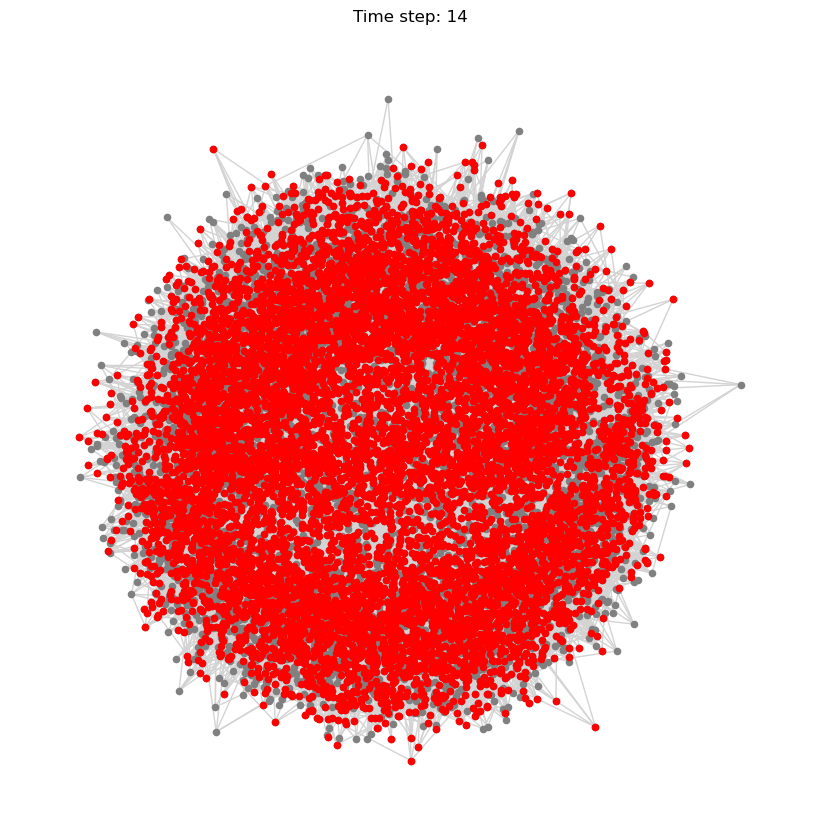

The time step required to reach the maximum number of active nodes: 14


In [130]:
for _ in range(9):
    initial_active_node ={ random.choice(list(G.nodes))}
    print(f"node is {initial_active_node}")
    max_time_step = independent_cascade(G, initial_active_node, 0.05)
    print(f"The time step required to reach the maximum number of active nodes: {max_time_step}")

In [65]:
import cv2
import os

def create_slideshow_video(images_dir='images', video_filename='slideshow_video.mp4', frame_rate=1):
    image_filenames = sorted([filename for filename in os.listdir(images_dir) if filename.endswith('.jpeg') or filename.endswith('.jpg')])

    if not image_filenames:
        print(f"No images found in directory: {images_dir}")
        return

    first_image_path = os.path.join(images_dir, image_filenames[0])
    first_image = cv2.imread(first_image_path)
    if first_image is None:
        print(f"Failed to read the first image from path: {first_image_path}")
        return
    
    frame_height, frame_width, _ = first_image.shape

    codec = cv2.VideoWriter_fourcc(*'mp4v')  # Use 'mp4v' codec for mp4 video format
    video_writer = cv2.VideoWriter(video_filename, codec, frame_rate, (frame_width, frame_height))

    for image_filename in image_filenames:
        image_path = os.path.join(images_dir, image_filename)
        image = cv2.imread(image_path)
        if image is not None:
            video_writer.write(image)

    video_writer.release()
    print(f"Slideshow video saved as: {video_filename}")


In [66]:
create_slideshow_video(images_dir='images', video_filename='slideshow_video.mp4', frame_rate=1)

Slideshow video saved as: slideshow_video.mp4


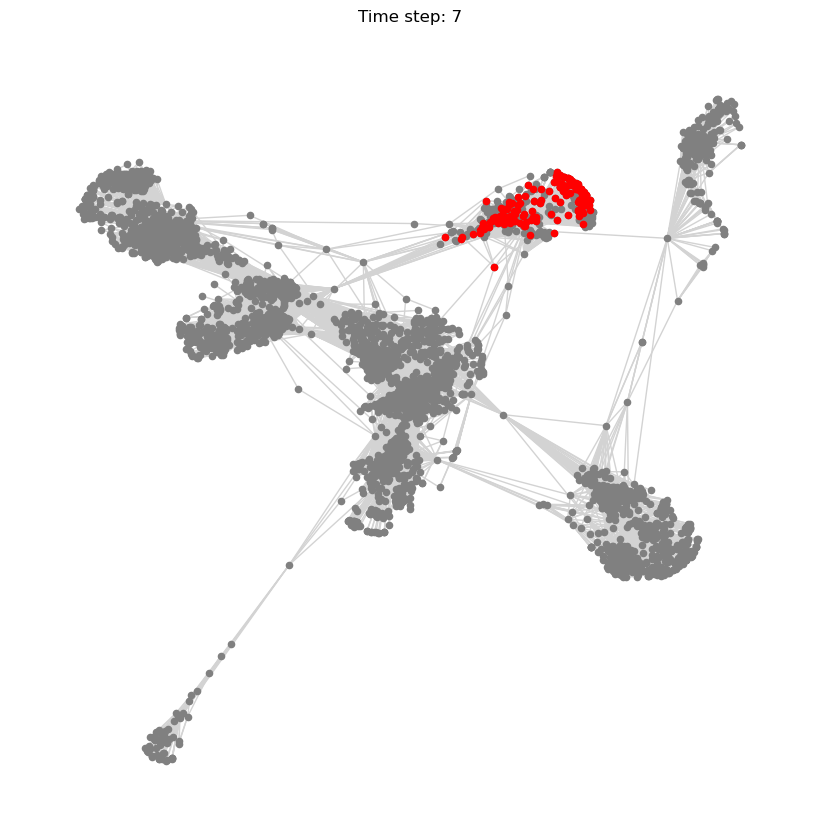

The time step required to reach the maximum number of active nodes: 7


In [122]:
assign_activation_probabilities(g)

# Define the initial active nodes (you can customize this set)
initial_active_nodes = {0}

# Apply the Independent Cascade model and visualize the process
max_time_step = independent_cascade(g, initial_active_nodes, 0.05)

print(f"The time step required to reach the maximum number of active nodes: {max_time_step}")

node is {2121}


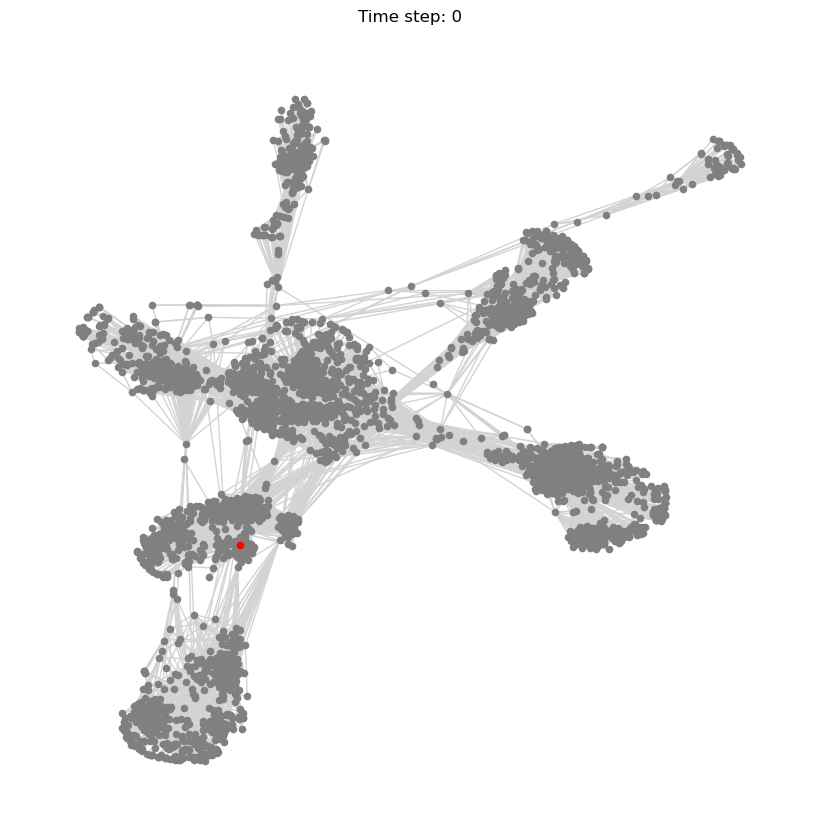

The time step required to reach the maximum number of active nodes: 0
node is {951}


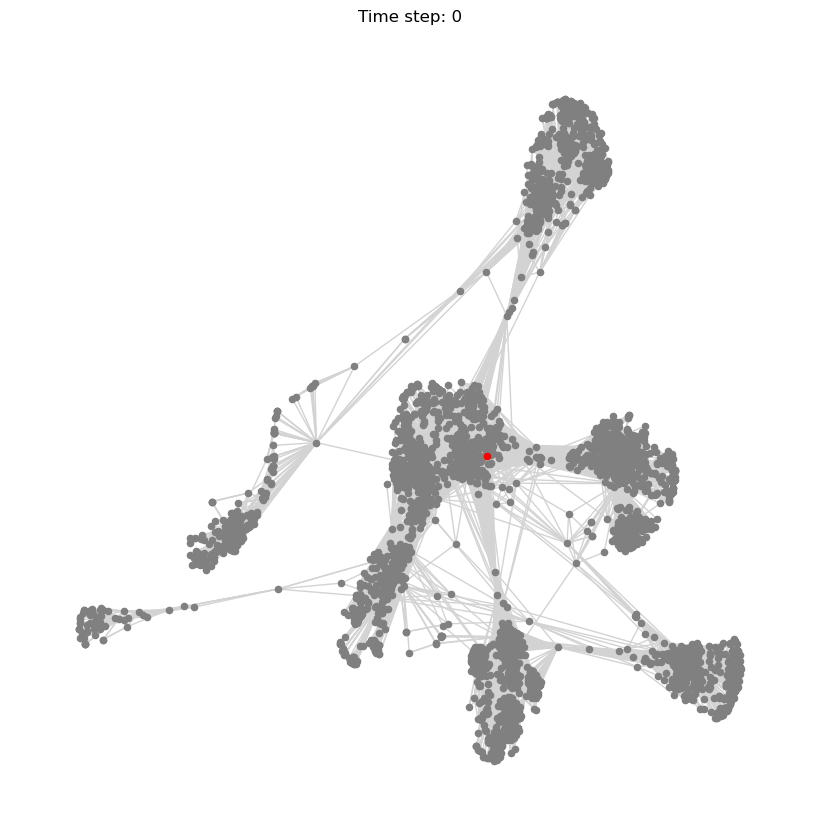

The time step required to reach the maximum number of active nodes: 0
node is {3188}


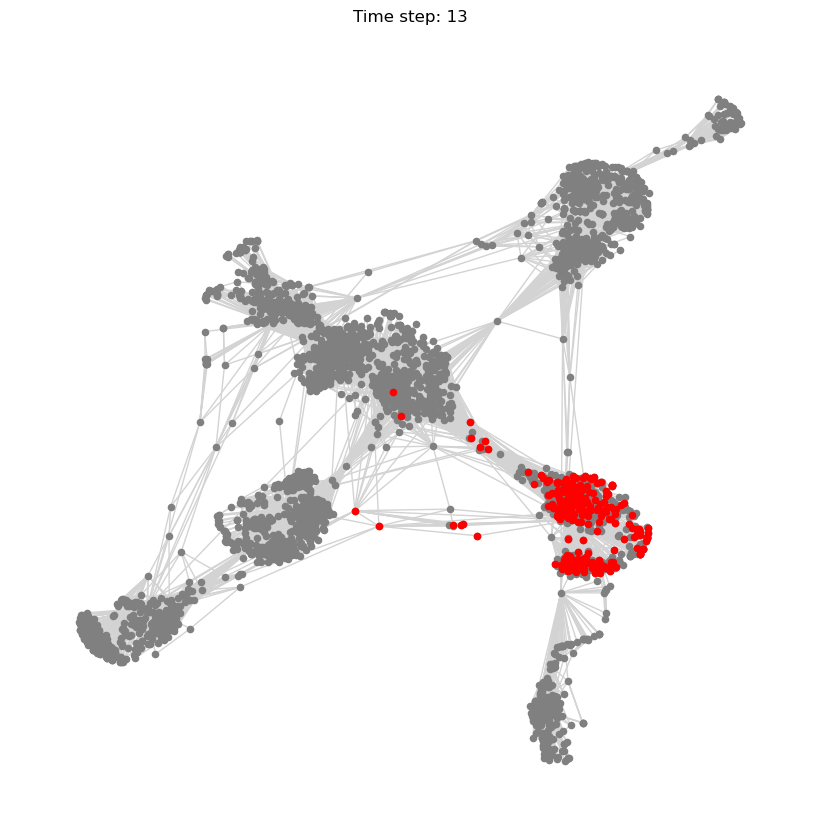

The time step required to reach the maximum number of active nodes: 13
node is {160}


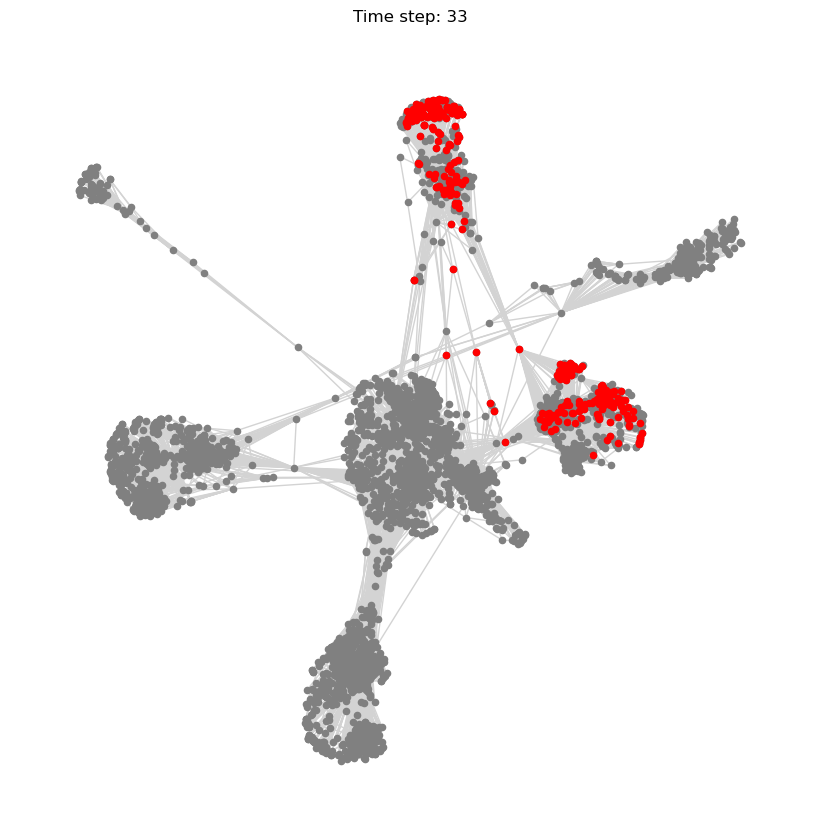

The time step required to reach the maximum number of active nodes: 33
node is {3528}


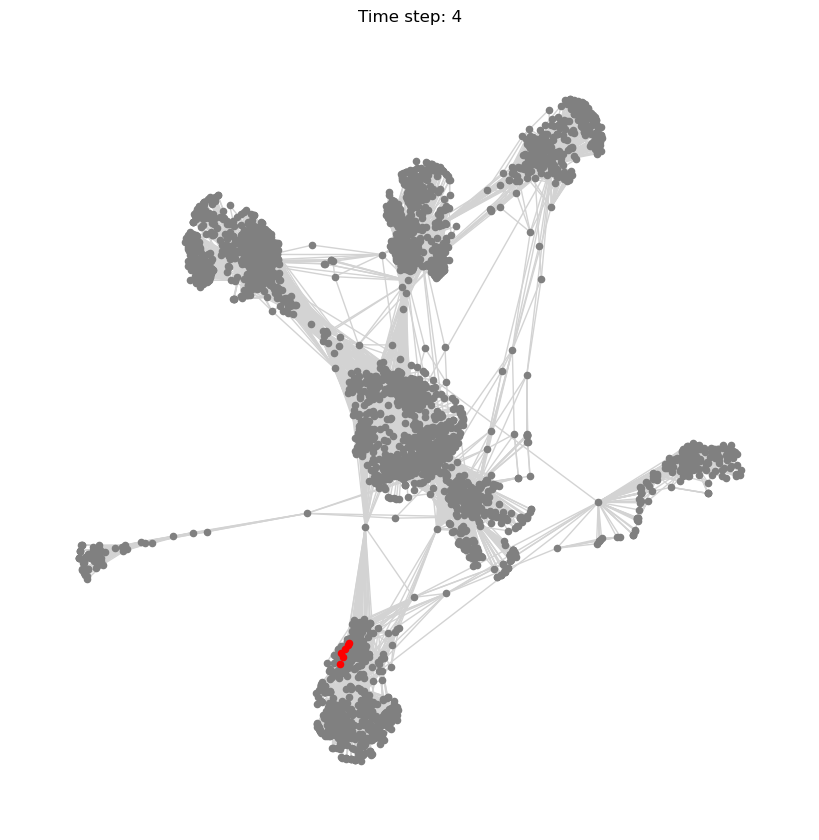

The time step required to reach the maximum number of active nodes: 4
node is {1769}


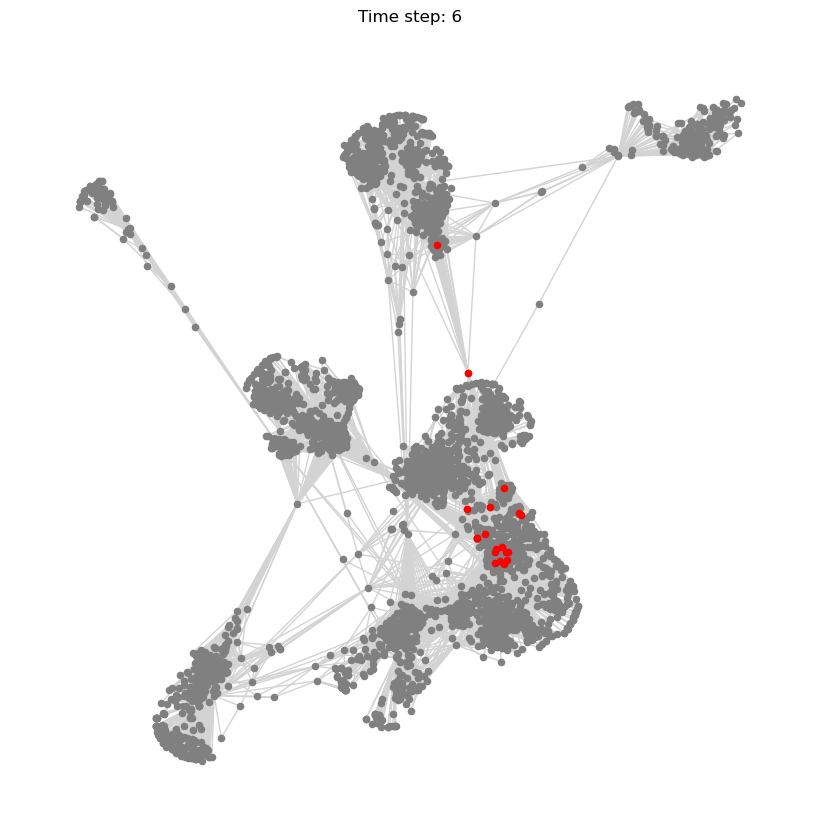

The time step required to reach the maximum number of active nodes: 6
node is {3335}


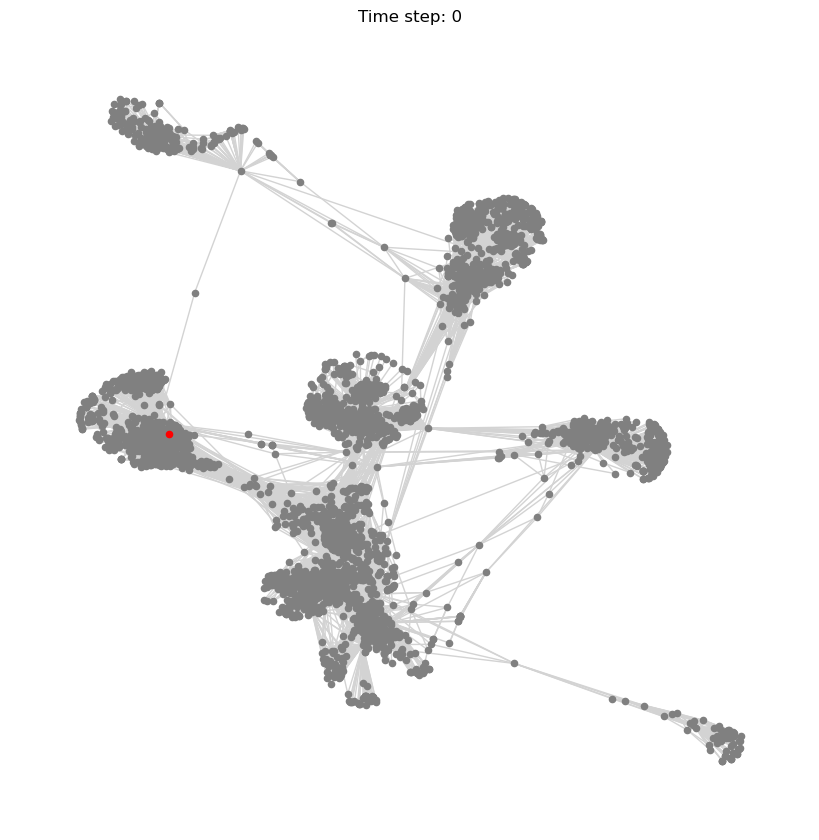

The time step required to reach the maximum number of active nodes: 0
node is {2092}


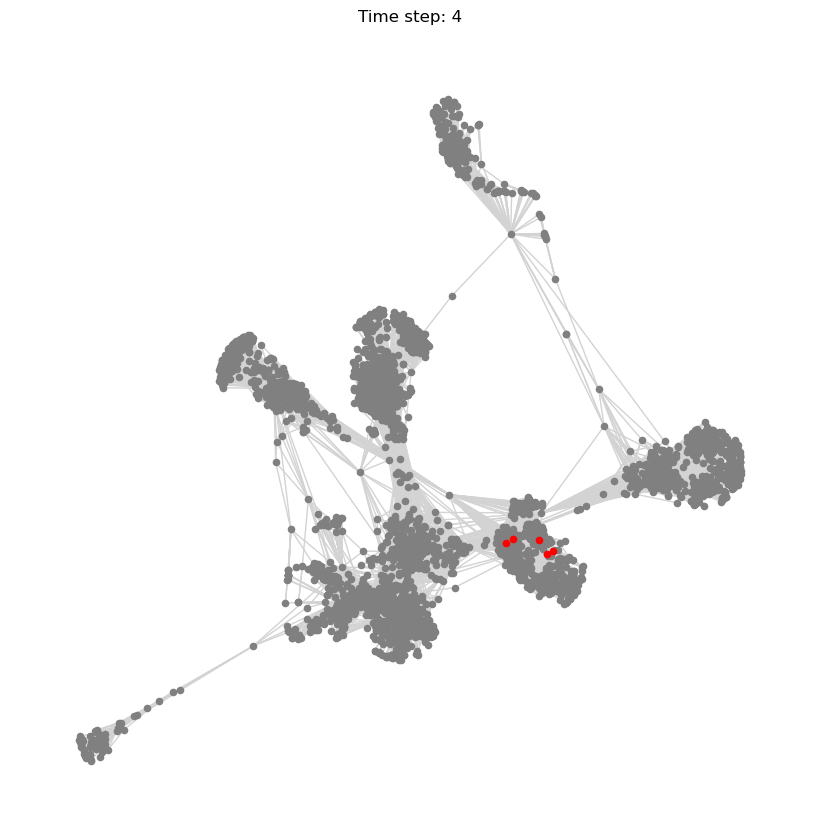

The time step required to reach the maximum number of active nodes: 4
node is {364}


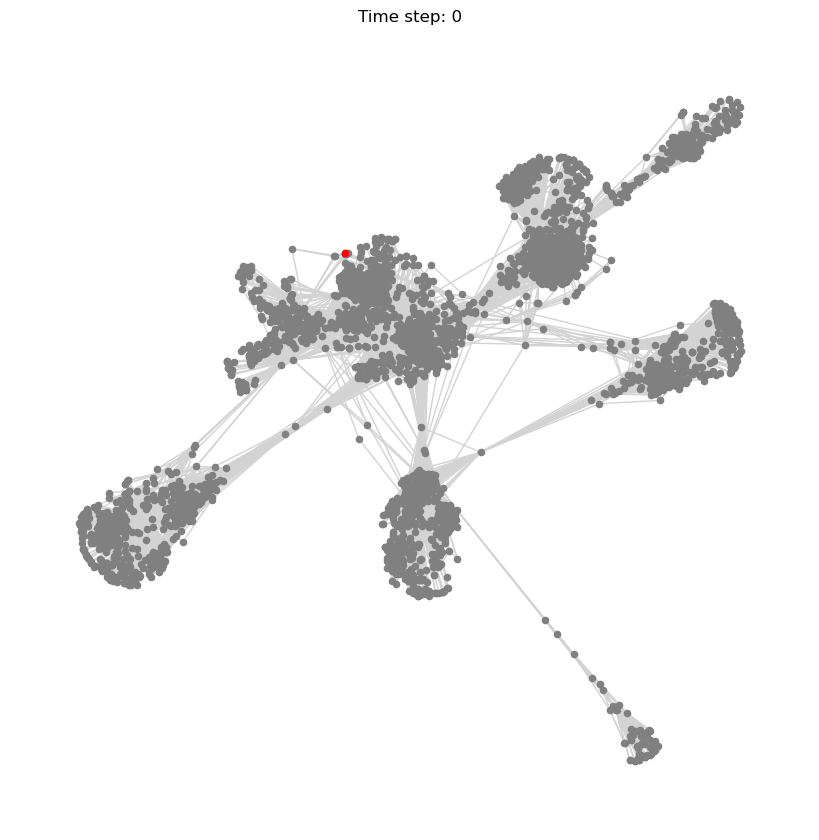

The time step required to reach the maximum number of active nodes: 0


In [129]:
for _ in range(9):
    initial_active_node ={ random.choice(list(g.nodes))}
    print(f"node is {initial_active_node}")
    max_time_step = independent_cascade(g, initial_active_node, 0.05)
    print(f"The time step required to reach the maximum number of active nodes: {max_time_step}")

node is {15}


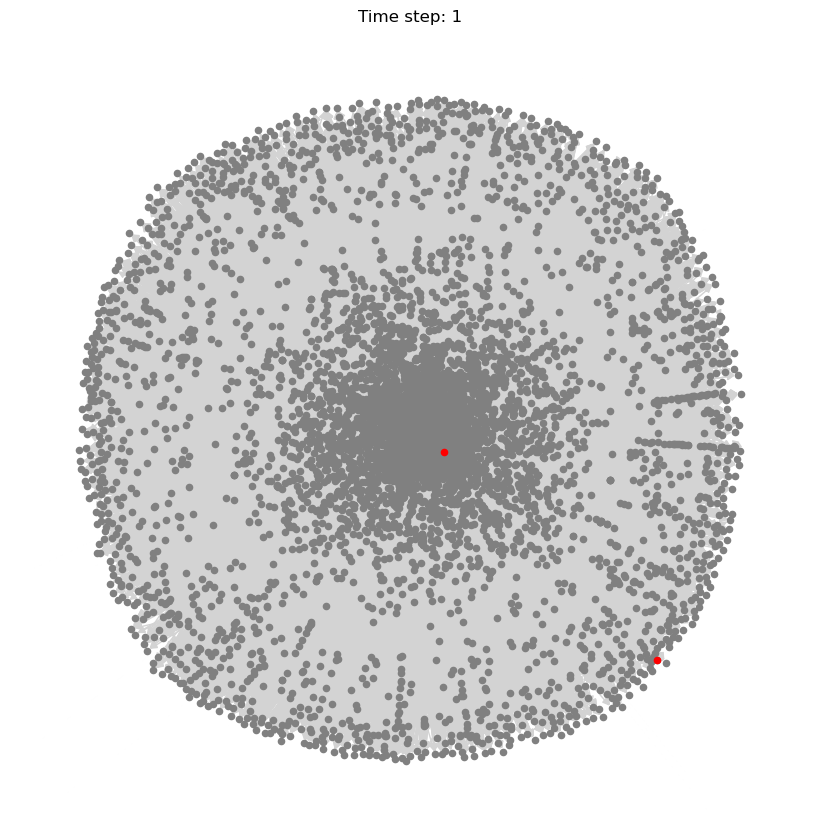

The time step required to reach the maximum number of active nodes: 1


In [11]:
initial_active_node = {15}
print(f"node is {initial_active_node}")
max_time_step = independent_cascade(wiki, initial_active_node, 0.05)
print(f"The time step required to reach the maximum number of active nodes: {max_time_step}")

node is {3084}


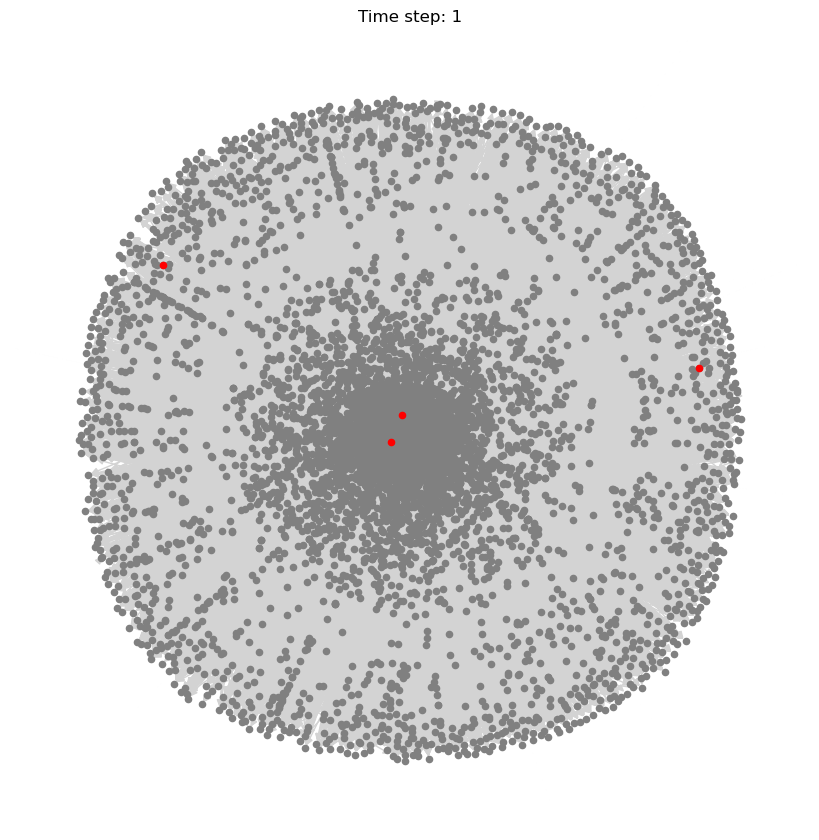

The time step required to reach the maximum number of active nodes: 1
node is {3398}


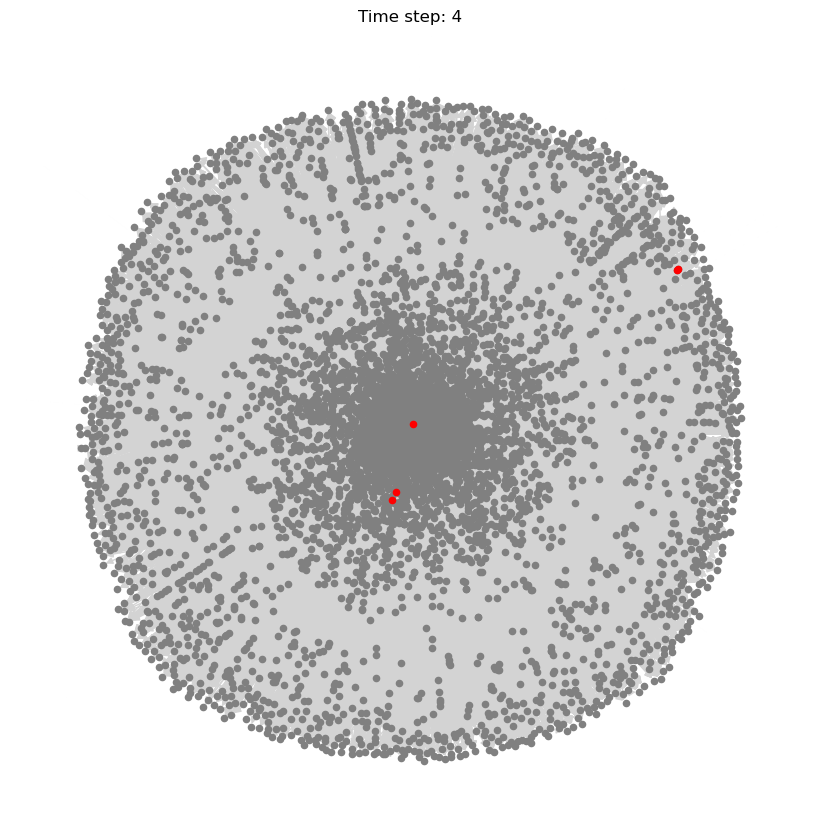

The time step required to reach the maximum number of active nodes: 4
node is {7054}


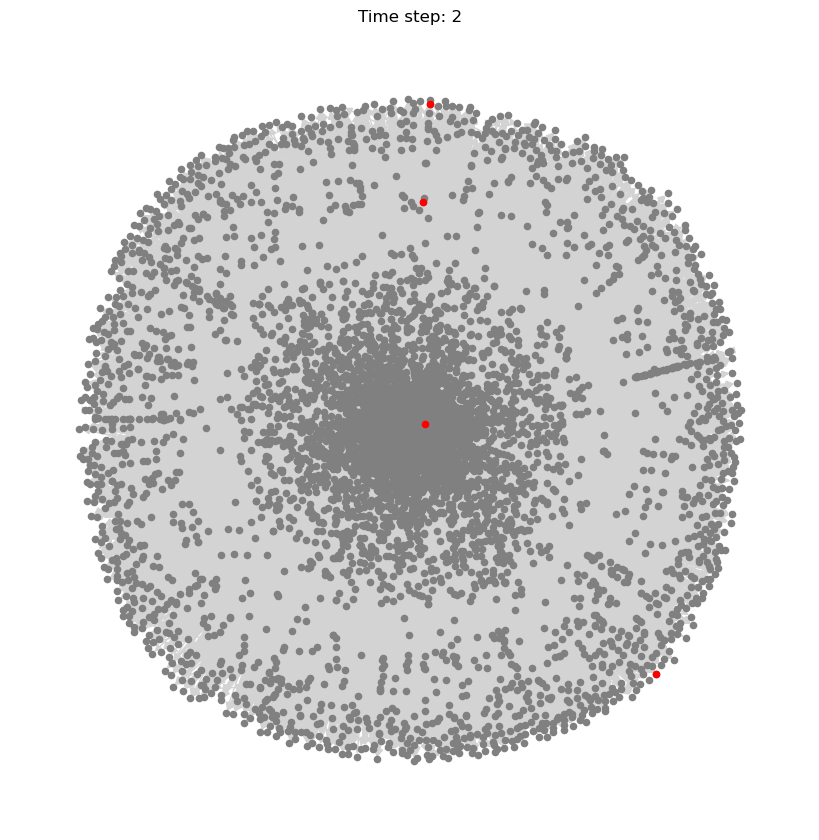

The time step required to reach the maximum number of active nodes: 2
node is {2000}


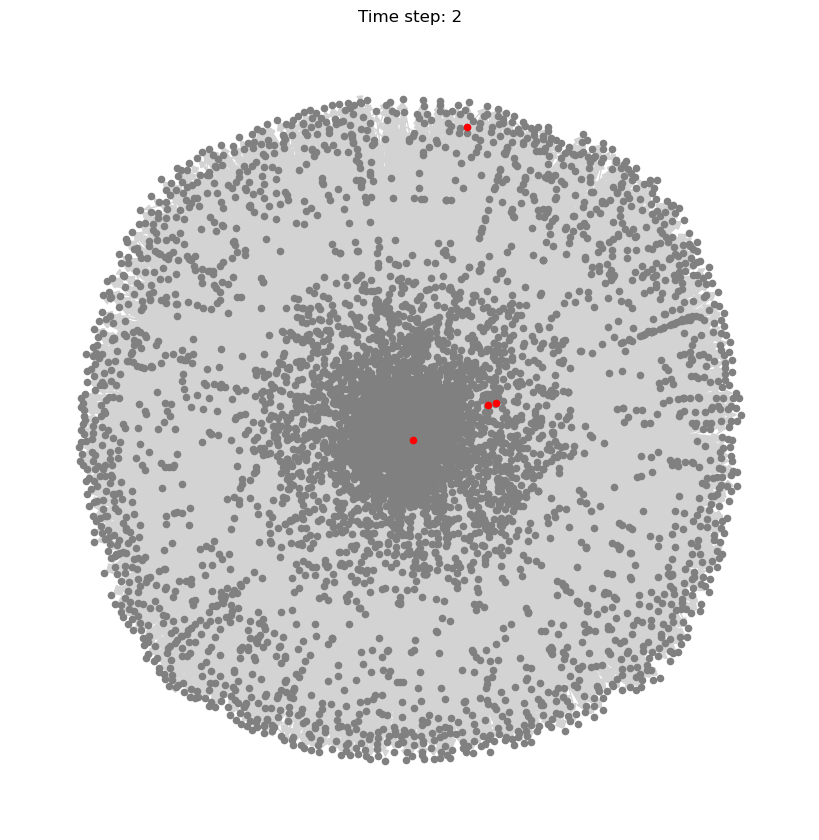

The time step required to reach the maximum number of active nodes: 2
node is {2469}


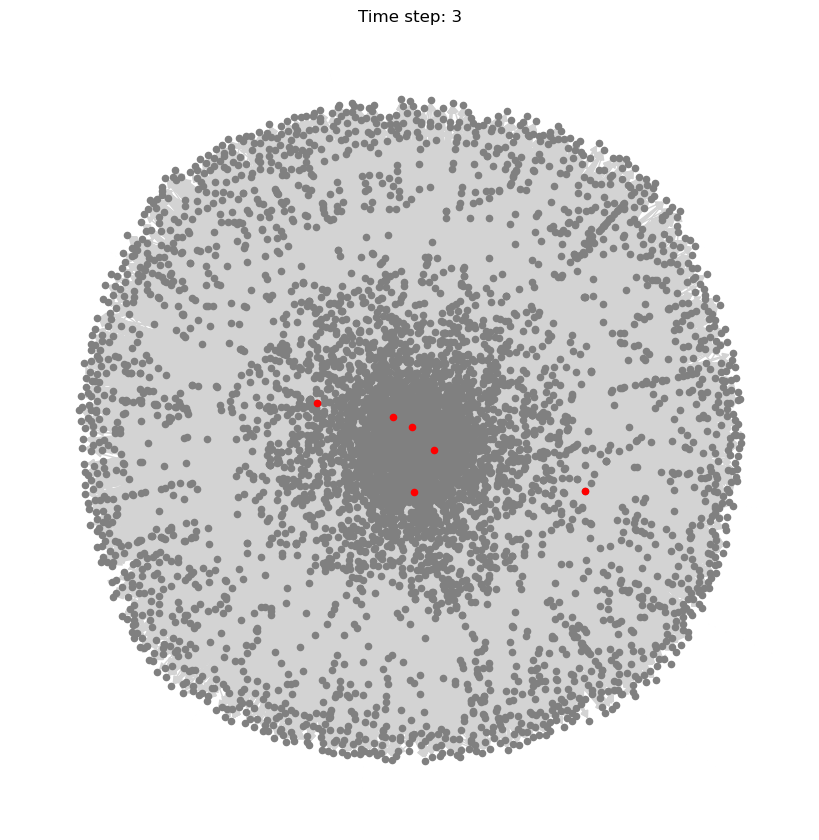

The time step required to reach the maximum number of active nodes: 3
node is {7086}


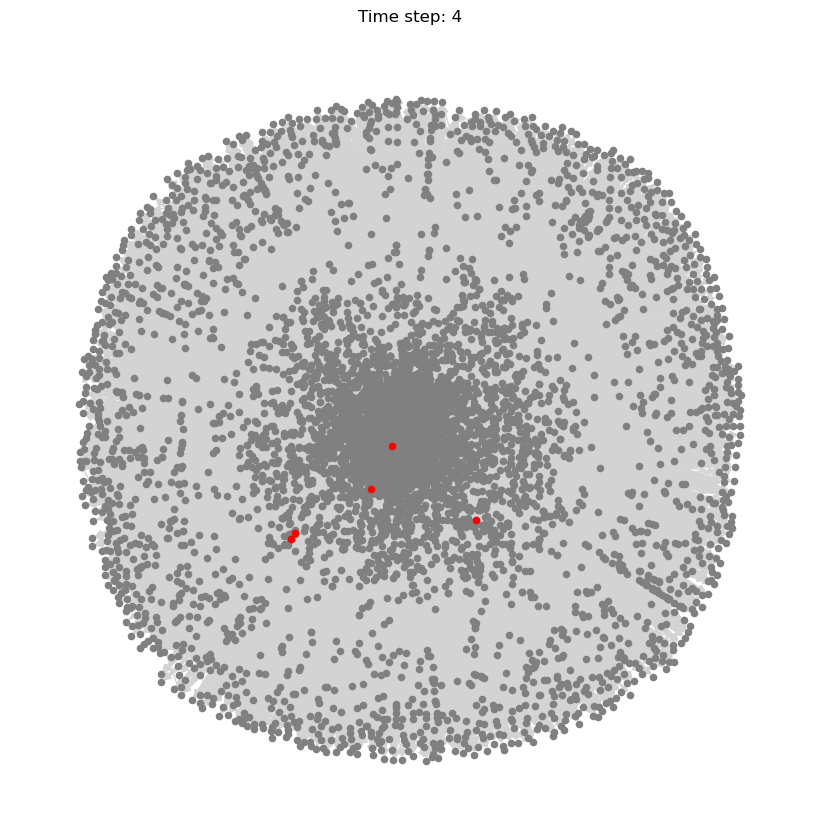

The time step required to reach the maximum number of active nodes: 4
node is {6457}


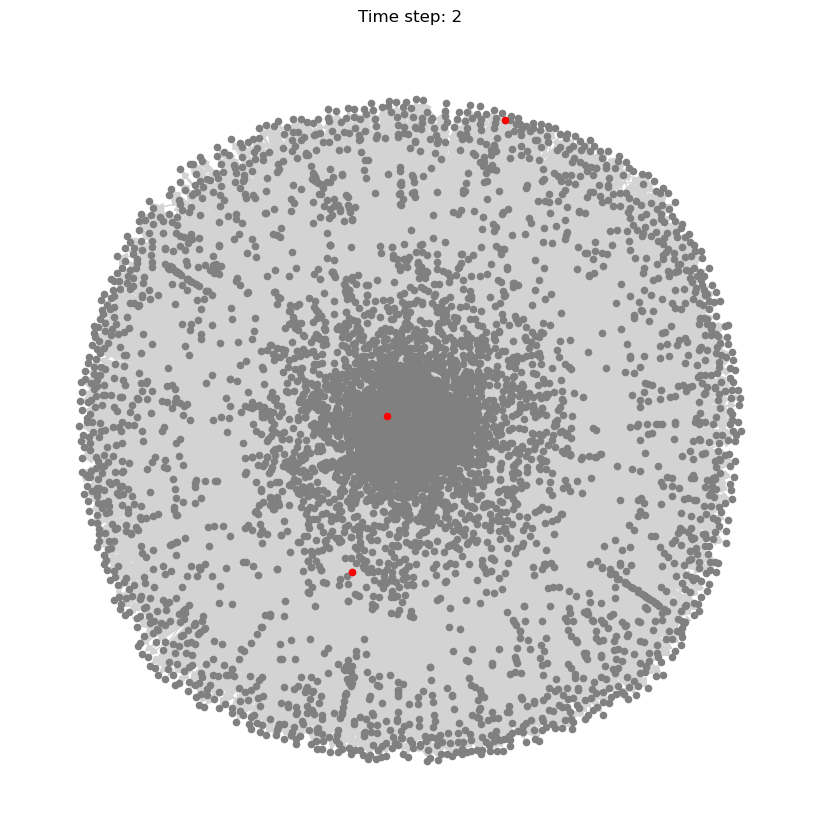

The time step required to reach the maximum number of active nodes: 2
node is {4417}


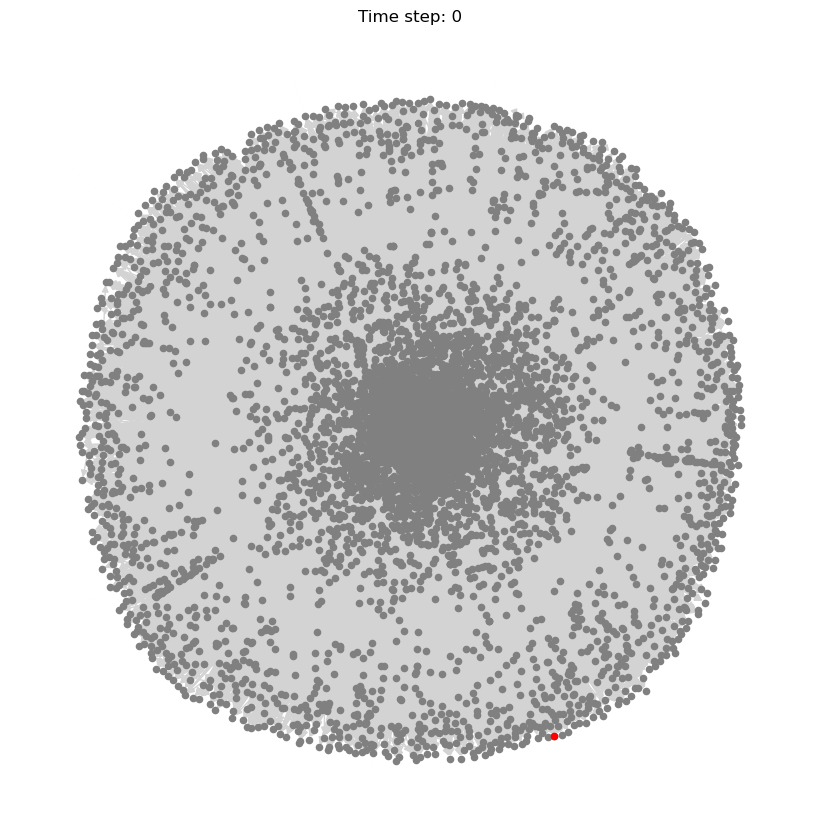

The time step required to reach the maximum number of active nodes: 0
node is {3890}


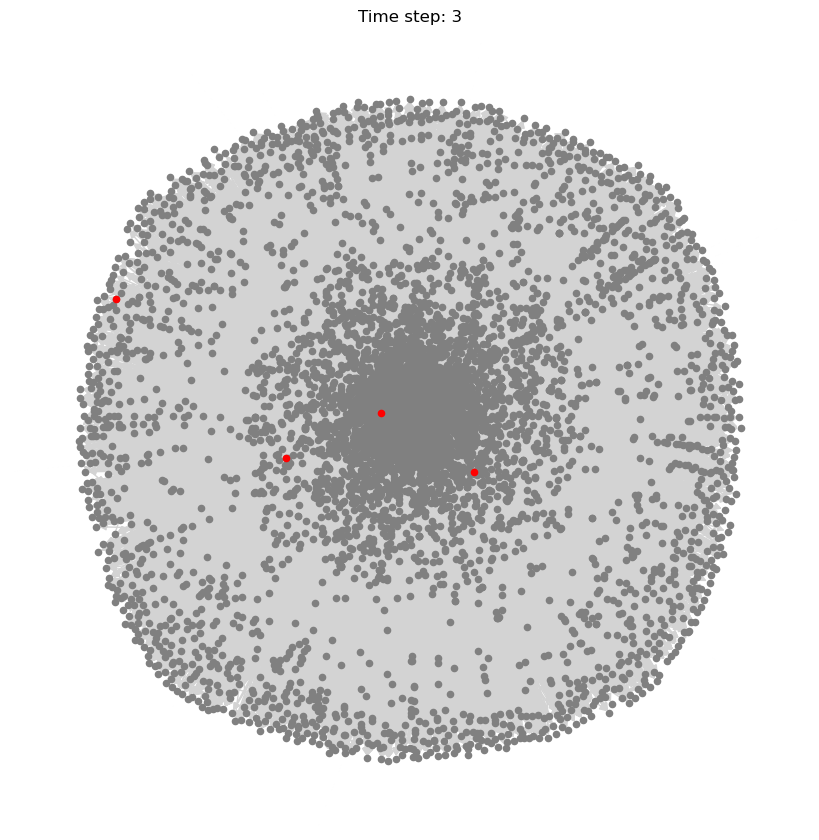

The time step required to reach the maximum number of active nodes: 3


In [131]:
for _ in range(9):
    initial_active_node ={ random.choice(list(wiki.nodes))}
    print(f"node is {initial_active_node}")
    max_time_step = independent_cascade(wiki, initial_active_node, 0.05)
    print(f"The time step required to reach the maximum number of active nodes: {max_time_step}")